<h1><center> Explore data, to find the better model input </center></h1>

Version with the most relevant plot

 ## Table of Contents

* [Study of the error itself](#part1)
    * [Display the error geographically every month](#part1_1)
* [Study of the links between the parameters](#part2)
    * [Correlation matrix between mean of parameters](#part2_1)
* [Study of the relationships between the error and the different data](#part3)
    * [Calculate the correlation of the error with each forcing](#part3_1)
        * [Correlation between each parameter (mean over time) and each PC of error's PCA](#part3_1_1)
        * [Correlation between parameters and error's time series in each geographical point](#part3_1_2)
    * [Try to find similarities in the temporal evolution](#part3_3)
        * [Auto correlation (no sum plot)](#part3_3_1)
        * [Cross correlation (no sum plot)](#part3_3_2)

In [1]:
%load_ext autoreload
%autoreload 1
%reload_ext autoreload


%aimport src.utils.tardisml_utils

In [2]:
import xarray as xr
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
import yaml
import pickle as pkl
import netCDF4 as nc4

import src.utils.load_config as load_config
import src.data_preparation.load_data as load_data
import src.feature_extraction.pca as feature_pca
import src.visualization.visualize_pca as visualize_pca
import src.visualization.visualize_error as visualize_error

import src.utils.tardisml_utils as tardisml_utils
rootdir = tardisml_utils.get_rootdir()
#import tardis_ml

login-2.fram.sigma2.no
fram detected
login-2.fram.sigma2.no
fram detected
login-2.fram.sigma2.no
fram detected
login-2.fram.sigma2.no
fram detected
login-2.fram.sigma2.no
fram detected
login-2.fram.sigma2.no
fram detected


In [10]:
# Load configuration

# Date to plot in example
idate = 100
# Path to config file
file_config = '../config/data_proc_full.yaml'
# Path to template file
file_template = '../config/template_name.yaml'

template = yaml.load(open(file_template),Loader=yaml.FullLoader)
nosit_dir, withsit_dir, _, forcing_bdir, pca_dir, res_dir, fig_dir, _ = load_config.load_filename(file_config)
timeofday, target_field, forcing_fields, covar_fields, lim_idm, lim_jdm, n_comp = load_config.load_config_params(file_config)

config = yaml.load(open(file_config), Loader=yaml.FullLoader)
n_components = 4 # config['n_components']

In [13]:
import src.feature_extraction.extract_pca as extract_pca

In [14]:
# Get data and compute pcas, eofs

# Chronology
# (the same for all forcing fields, just take the first one)
# df = pd.read_pickle(os.path.join(rootdir,forcing_bdir,f'mslprs.pkl'))
# chrono = df[df.time%1==timeofday].date

chrono = np.load(os.path.join(rootdir, forcing_bdir, f'chrono_forcings.npy'))
chrono = pd.to_datetime(chrono)

# Load landmask
# mskok1d, mskok = load_data.get_land_mask(lim_idm, lim_jdm, rootdir, pca_dir)
# pca_dir='Leo/results/pca_i200-600_j600-881'


# ---- Loading Target var PCA - No SIT assimilation ----
# data_kind = "nosit"
# n_components = load_config.get_n_components(data_kind, file_config)
# filename = os.path.join(rootdir,pca_dir,f"pca_{target_field}_{n_components}N_noSITass.pkl")
# pca_f = load_data.load_pca(filename)

# # load X, mu, RMSE
# filename = os.path.join(rootdir,pca_dir,f"{target_field}_forecast_noSITass.nc")
# Xf, mu_f, RMSE_f = load_data.load_nc(filename, target_field)

# # retrieve PC and EOF values
# PCs_f = feature_pca.pca_to_PC(pca_f, Xf, mskok1d)
# EOF1d_f, EOF2d_f = feature_pca.compute_eof(n_components, Xf, pca_f, mskok)

# # Reconstruction from PCA
# Xf_rec = xr.dot(EOF2d_f,PCs_f) + mu_f
# # RMSE for comparison with RMSE predicted by ML
# #RMSE_recf = np.sqrt((np.square(Xf_rec-Xf)).mean(dim='rdim'))


# # ---- Loading Target var PCA - No SIT assimilation ----
# data_kind = "withsit"
# n_components = load_config.get_n_components(data_kind, file_config)
# filename = os.path.join(rootdir,pca_dir,f"pca_{target_field}_{n_components}N_SITass.pkl")
# pca_a = load_data.load_pca(filename)

# # load X, mu, RMSE
# filename = os.path.join(rootdir,pca_dir,f"{target_field}_forecast_SITass.nc")
# Xa, mu_a, RMSE_a = load_data.load_nc(filename, target_field)

# # retrieve PC and EOF values
# PCs_a = feature_pca.pca_to_PC(pca_a, Xa, mskok1d)
# EOF1d_a, EOF2d_a = feature_pca.compute_eof(n_components, Xa, pca_a, mskok)
# # Reconstruction from PCA
# Xa_rec = xr.dot(EOF2d_a,PCs_a) + mu_a
# # RMSE for comparison with RMSE predicted by ML
#RMSE_reca = np.sqrt((np.square(Xa_rec-Xa)).mean(dim='rdim'))


# ---- Loading error of Target var PCA SIT assimilation - no assimilation ----
data_kind = "withsit"
n_components = load_config.get_n_components(data_kind, file_config)
filename = os.path.join(rootdir,pca_dir,f"pca_{target_field}_{n_components}N_SITerr.pkl")
pca_e = load_data.load_pca(filename)
# load X, mu, RMSE
filename = os.path.join(rootdir,pca_dir,f"{target_field}_TOPAZ4err.nc")
Xe, mu_e, RMSE_e = load_data.load_nc(filename, target_field)

# compute again because save with different indexes on dimension 'time'
maskok = (np.isfinite(Xe)).all(dim='time')
maskok1d = maskok.stack(z=('y','x'))

# retrieve PC and EOF values
PCs_e = extract_pca.pca_to_PC(pca_e, Xe, maskok1d)
# PCs_e = feature_pca.pca_to_PC(pca_e, Xe, mskok1d)
EOF1d_e, EOF2d_e = extract_pca.compute_eof(n_components, Xe, pca_e, maskok)

# Reconstruction from PCA
Xe_rec = xr.dot(EOF2d_e,PCs_e) + mu_e
# RMSE for comparison with RMSE predicted by ML
#RMSE_rece = np.sqrt((np.square(Xe_rec-Xe)).mean(dim='rdim'))

Load PCA: /nird/projects/nird/NS2993K/Leo/results/pca_i100-550_j300-629/pca_sithick_8N_SITerr.pkl



In [15]:
Xe.shape

(3381, 329, 450)

In [20]:
chrono_e = pd.to_datetime(Xe['time'])

In [22]:
chrono_e.shape

(3381,)

In [5]:
pca_dir='Calliope/results/pca_i200-600_j600-881'

In [6]:
import src.feature_extraction.pca as feature_pca
data_dir = nosit_dir
list_files = feature_pca.missing_file(chrono, data_dir, template)
nc_f = xr.open_mfdataset(list_files, combine='nested', concat_dim='rdim')

# Load covariables 1t
nc1 = xr.open_dataset(os.path.join(rootdir, withsit_dir, 'TP4DAILY_2014_000.nc'))

In [7]:
#Load forcing values
forcing_fields = ["airtmp", "dewpt", "mslprs", "nlwrad", "nswrad", "precip", "radflx", "shwflx", "vapmix", "wndewd", "wndnwd"]
forcing_fields = [f + "_mean21d" for f in forcing_fields]
forcings = dict()
filepath = "/nird/projects/nird/NS2993K/Calliope/forcings/"
for field in forcing_fields:
    forcings[field] = np.load(f'{filepath}{field}.npy')
Nf = len(forcing_fields) # Number of forcing fields

In [8]:
covar_fields = [
 'ssh00',
 'fice00',
 'hice00',
 'hsnw00',
 'htndncy00',
 'albedo00',
 'emnp00',
 'salflx00',
 'spdice00',
 'surflx00',
 'surflxs00',
 'swflx00',
 ##'sstb00',
 ##'msshb00',
 'saln01',
 'temp01',
 'kinetic01',
 'taux00',
 'tauy00',
 'tauxi00',
 'tauyi00',
 'ubavg00',
 'vbavg00',
 'uice00',
 'vice00',
 'utot01',
 'vtot01'
]

In [9]:
# Loading covariable PCA - noSIT assimilation
data_kind = "covariable"
n_components = load_config.get_n_components(data_kind, file_config)
PCs_co = load_data.load_covariables(covar_fields, mskok1d, pca_dir, n_components)

# Loading forcings PCA
data_kind = "forcing"
filename='/nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_airtmp-dewpt-mslprs-nlwrad-nswrad-precip-radflx-shwflx-vapmix-wndewd-wndnwd_8N_21d.pkl'
#filename = load_config.get_pca_filename(data_kind, file_config, pca_dir)
PCs, EOFs = load_data.load_forcing_PC_EOF(filename, forcing_bdir, forcing_fields)

Retrieve ssh00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_ssh00_8N_noSITass.pkl

Retrieve fice00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_fice00_8N_noSITass.pkl

Retrieve hice00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hice00_8N_noSITass.pkl

Retrieve hsnw00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hsnw00_8N_noSITass.pkl

Retrieve htndncy00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_htndncy00_8N_noSITass.pkl

Retrieve albedo00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_albedo00_8N_noSITass.pkl

Retrieve emnp00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_emnp00_8N_noSITass.pkl

Retrieve salflx00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_salflx00_8N_noSITass.pkl

Retrieve spdice00
Lo

### Util functions

In [10]:
# get index of non NaN values
sel = nc1["hice00"].sel(jdim=slice(*lim_jdm),idim=slice(*lim_idm)).mean(dim='rdim').values
index_mask = np.argwhere(~np.isnan(sel)).T

In [11]:
def apply_mask_nonan(X, index_mask):
    X = X[tuple(index_mask)]
    return X

def get_area(data, lim_idm, lim_jdm, exclude=[], index_mask=[]):
    """ Keep only data for given geographical zone
    In:
        data        : dict or xarray.core.dataset.Dataset -- Data to process
        lim_idm     : tuple                               -- limits of the geographical area to be preserved (following axes x)
        lim_jdm     : tuple                               -- limits of the geographical area to be preserved (following axes y)
        index_mask : numpy.ndarray                       -- for forcings : index of no nan value to keep 
        
    Out:
        X_sel       : dict -- key = field name, value = (y, x) array, data array restricted to the given geographical area and mean over time
        X_sel_nonan : dict -- same than Xm_sel without NaN values
    """
    
    if type(data) is dict:
        fields = [f for f in data.keys() if f not in exclude]
    else:
        fields = [f for f in data.data_vars if f not in exclude]

    X_sel = dict()
    X_sel_nonan = dict()
    t = data[fields[0]].shape[0]
    n = index_mask.shape[1]
    
    for field in fields:
        if type(data) is dict:
            # TODO : geographical zone uncheck
            X_sel[field] = data[field]
            X_sel_nonan[field] = np.empty([t, n])
            for time in range(t):
                X_sel_nonan[field][time] = apply_mask_nonan(X_sel[field][time], index_mask)
        else:
            X_sel[field] = data[field].sel(jdim=slice(*lim_jdm),idim=slice(*lim_idm)).values
            X_sel_nonan[field] = X_sel[field][np.isfinite(X_sel[field])]
            X_sel_nonan[field] = np.reshape(X_sel_nonan[field], (t, n))
        


    return X_sel, X_sel_nonan

In [12]:
exclude = ["longitude", "latitude", "dx", "dy", "fyear", "depth"]

# select geographical area
X_sel_cov, X_sel_nonan_cov = get_area(nc_f, lim_idm, lim_jdm, exclude, index_mask)
_, X_sel_nonan_fgs = get_area(forcings, lim_idm, lim_jdm, exclude, index_mask)

In [198]:
def zone_mean_data(data_sel, exclude=[], index_mask=[]):
    """ Keep only data for given geographical zone + if several times keep only the mean
    In:
        data_sel   : dict or xarray.core.dataset.Dataset -- Data to process
        exclude    : String list                         -- data field to exclude
        index_mask : numpy.ndarray                       -- for forcings : index of no nan value to keep 
        
    Out:
        Xm_sel       : dict -- key = field name, value = (y, x) array, mean over time
        Xm_sel_nonan : dict -- same than Xm_sel without NaN values
    """
    
    if type(data_sel) is dict:
        fields = [f for f in data_sel.keys() if f not in exclude]
    else:
        fields = [f for f in data_sel.data_vars if f not in exclude]

    Xm_sel = dict()
    Xm_sel_nonan = dict()
    
    for field in fields:
        if type(data_sel) is dict:
            Xm_sel[field] = np.mean(data_sel[field], axis=0)
            Xm_sel_nonan[field] = Xm_sel[field][tuple(index_mask)]
        elif data_sel.dims["rdim"] > 1:
            Xm_sel[field] = data_sel[field].mean(dim='rdim').values
            Xm_sel_nonan[field] = Xm_sel[field][np.isfinite(Xm_sel[field])]
        else:
            Xm_sel[field] = data_sel[field].values
            Xm_sel_nonan[field] = Xm_sel[field][np.isfinite(Xm_sel[field])]

    return Xm_sel, Xm_sel_nonan

In [ ]:
# compute temporal mean for each dataset, 
#Xm_sel_1, Xm_sel_nonan_1 = zone_mean_data(nc1)
Xm_sel_cov, Xm_sel_nonan_cov = zone_mean_data(X_sel_cov)
Xm_sel_fgs, Xm_sel_nonan_fgs = zone_mean_data(forcings, index_mask=index_mask)

In [199]:
Xm_sel_fgs, Xm_sel_nonan_fgs = zone_mean_data(forcings, index_mask=index_mask)

# Study of the error itself <a class="anchor" id="part1"></a>
  Search for seasonality

##  Display the error geographically every month <a class="anchor" id="part1_1"></a>

In [127]:
Xe[0]

<xarray.DataArray 'sithick' (y: 329, x: 450)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time       datetime64[ns] 2010-09-29
    latitude   (y, x) float32 62.74 62.83 62.92 63.01 ... 56.49 56.41 56.33
    longitude  (y, x) float32 -100.5 -100.4 -100.3 -100.1 ... 82.73 82.61 82.5
  * x          (x) float32 -25.5 -25.38 -25.25 -25.12 ... 30.25 30.38 30.5 30.62
  * y          (y) float32 -17.5 -17.38 -17.25 -17.12 ... 23.12 23.25 23.38 23.5

In [148]:
def plot_monthly(Xf, Xa, Xe, target_field, month, years, showfig=True, savefig=False):
    """ Plot for a given month and year the given models
    In:
        Xf           : forecast 
        Xa           : assimilation
        Xe           : error
        target_field : 
        month        : 
        years        :
    """
    if Xf is not None:
        fig, ax = plt.subplots(ncols=3, figsize=(16,9))
        
        Xf.plot(ax=ax[0], vmax=4)
        Xa.plot(ax=ax[1], vmax=4)
        Xe.plot(ax=ax[2], vmin=-1.5, vmax=1.5, cmap=plt.get_cmap('coolwarm'));
        ax[0].set_title('Forecast')
        ax[1].set_title(f'SIT assimilated')
        ax[2].set_title('A - F')
        fig.suptitle(f'{target_field} for month {month}, {years[0]}-{years[-1]}');
        plt.show()
        
    else:
        ncol = 4  # len(Xe)
        nrow = 3
        fig, axes = plt.subplots(ncols=ncol, nrows=nrow, figsize=(16,9))

        for i, v in enumerate(Xe):
            ax = axes.flatten()[i]
            if np.isnan(v).all():  # if empty / all nan
                axes.flatten()[0].set_visible(False)
                continue
            else:
                v.plot(ax=ax, vmin=-1.5, vmax=1.5, cmap=plt.get_cmap('coolwarm'));
            ax.set_title(f'{i+years[0]}')
            ax.set_ylabel('')
            ax.set_xlabel('')
        
        axes.flatten()[-1].set_visible(False)
        axes.flatten()[-2].set_visible(False)
        fig.suptitle(f'{target_field} for month {month}');
        plt.tight_layout()

        if savefig:
            odir = '/nird/projects/nird/NS2993K/Leo/results/intercomp/'
            ofile = f'SIT_bias_monthly_{month:02}.png'
#             ofile = save_name.check(f"{odir}", filename)
            plt.savefig(f"{odir}{ofile}", dpi=400)
            print(f'Saved as: {odir}{ofile}')

        if showfig:
            plt.show()


        plt.close()
        
        
        
def plot_error_monthly(chrono, Xf, Xa, Xe, doMean, showfig=True, savefig=False):
    """ Plot the error monthly, for each year, or for the mean of each month over all years
    In:
        chrono 
        Xf
        Xa
        Xe
        doMean : boolean -- if true, plot the mean over all year (12 plots), else for each year (12*nb_year plots)
    """
    # Identify months and years
    time = pd.DataFrame([chrono.values]).transpose()
    time['month'] = time[0].dt.month
    if not doMean:
        time['year'] = time[0].dt.year
    time.drop(0, axis=1, inplace=True)
    years = np.unique(chrono.values.astype('datetime64[Y]').astype(int) + 1970)
    
    Xf_mt = [None for i in range(12)]
    Xa_mt = [None for i in range(12)]
    Xe_mt = [None for i in range(12)]
    X_mt = dict()

    for month in range(1, 13):
        if doMean: 
            idx = time.index.where((time['month']==month))
            idx = idx.dropna().astype(int)  # integer without nan
            
            # compute means (mt for mean temporal)
            index = month-1
            Xf_mt[index] = np.mean(Xf.isel(time=idx.values),axis=(0))
            Xa_mt[index] = np.mean(Xa.isel(time=idx.values),axis=(0))
            Xe_mt[index] = np.mean(Xe.isel(time=idx.values),axis=(0))

            plot_monthly(Xf_mt[index], Xa_mt[index], Xe_mt[index], "hice00", month, years)
            
        else:
            print(f"MONTH {month}")
            X_mt[month] = [None for i in years]
            for year in years:
                idx = time.index.where((time['month']==month) & (time['year']==year))
                idx = idx.dropna().astype(int)  # integer without nan

                # compute means (mt for mean temporal)
                X_mt[month][year-2010] = np.mean(Xe.isel(time=idx.values),axis=(0))
              
            plot_monthly(None, None, X_mt[month], "sithick", month, years, showfig=showfig, savefig=savefig)
            X_mt[month] = np.array(X_mt[month])
            
    return  np.array(Xf_mt), np.array(Xa_mt), np.array(Xe_mt), X_mt

In [92]:
time = pd.DataFrame([chrono_e.values]).transpose()
time['month'] = time[0].dt.month
time['year'] = time[0].dt.year

In [109]:
idxx = time.index.where((time['month']==10) & (time['year']==2010))

In [142]:
np.isnan(X_mt[8][0]).all()

True

In [99]:
np.where(idxx==np.nan)

(array([], dtype=int64),)

In [ ]:
# Display the error geographically each month of each year
_, _, _, X_mt = plot_error_monthly(chrono_e, None, None, Xe, False, savefig=True, showfig=False)

MONTH 1
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_01.png
MONTH 2
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_02.png
MONTH 3
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_03.png
MONTH 4
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_04.png
MONTH 5
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_05.png
MONTH 6
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_06.png
MONTH 7
Saved as: /nird/projects/nird/NS2993K/Leo/results/intercomp/SIT_bias_monthly_07.png
MONTH 8


# Study of the links between the parameters <a class="anchor" id="part2"></a>

If some are highly correlated, they may be redundant and giving them all overloads the model

### Correlation matrix between mean of parameters <a class="anchor" id="part2_1"></a>

In [18]:
def plot_correlation_matrix(data, title=''):
    """ Plot the correlation matrix for the given data
    In:
        data : 2D data for several parameters
            Can take 2 types :
            -> xarray.core.dataset.Dataset with rdim = 1
            -> dict with keys = fields name and values = 2D values
    """
    if type(data) == dict:
        Xm_sel_1D = {k: v.flatten() for k, v in data.items()} # 2D to 1D
        nc_pd = pd.DataFrame.from_dict(Xm_sel_1D)
        fields = data.keys()
    else:
        nc_pd = data.to_dataframe()
        fields = [f for f in data.data_vars]
       
    corr_matrix = nc_pd.corr()

    fig = plt.figure(figsize=(int(0.5*len(fields)), int(0.40*len(fields))))
    plt.matshow(corr_matrix, fignum=fig.number, cmap=plt.cm.Blues)
    plt.xticks(range(len(fields)), fields, rotation= -45)
    plt.yticks(range(len(fields)), fields)
    plt.title(f'Correlation matrix {title}')
    

    for i in range(len(corr_matrix)):
        for j in range(len(corr_matrix)):
            c = corr_matrix.values[j, i]

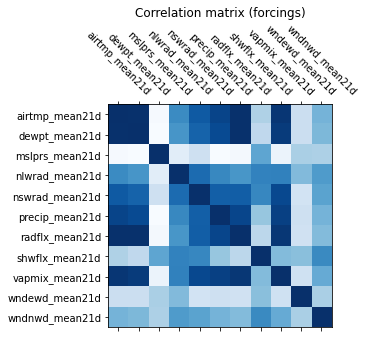

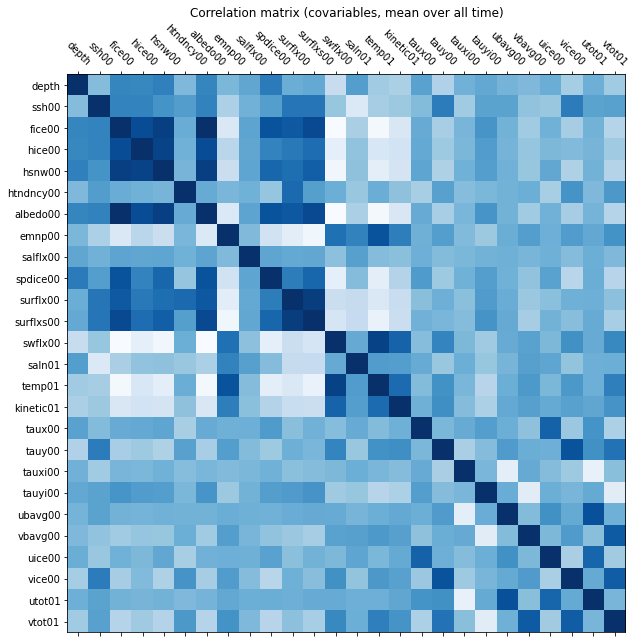

In [19]:
# forcings 
plot_correlation_matrix(Xm_sel_fgs, "(forcings)")

# covariables, mean all times
plot_correlation_matrix(Xm_sel_cov, "(covariables, mean over all time)")

# covariables, one time
#plot_correlation_matrix(Xm_sel_1, "(covariables, one time)")

# Study of the relationships between the error and the different data <a class="anchor" id="part3"></a>

Find the most appropriate data to give as input to the model

Different data :
- covariables
- forcings
- theirs pca (how many components ? For each parameter or for a mean over several of them ?)

## Calculate the correlation of the error with each parameter <a class="anchor" id="part3_1"></a>

Use the error's pca and analyze for the reals values of each covariables and forcing

### Correlation between each parameter (mean over time) and each PC of error's PCA <a class="anchor" id="part3_1_1"></a>

In [12]:
def compute_correlation(X, pca):
    """ Compute the correlation between each field of X and each PC of pca
    In:
        X   : dict                           -- parameters data (1D without NaN values)
        pca : sklearn.decomposition._pca.PCA -- pca to compare with
    Out:
        cor : dict of numpy.ndarray -- dict where key is field name, containing n_component elements corresponding to correlations values
    """
    
    fields = X.keys()
    comp = pca.components_

    cor = dict()
    for field in fields:
        cor[field] = np.empty([len(comp[:, 0])])
        for pc in range(len(comp[:, 0])):
            cor[field][pc] = np.corrcoef(comp[pc], X[field])[0][1] #take 1 elem as it's sympetric + autocorrelation==1
    return cor

def compute_pcs_correlation(PCs, PCs_params):
    """ Same than compute_correlation, but bteween 2 PCs
    In:
        PCs        : xarray.core.dataarray.DataArray         -- PCs shape (n, nb_comp)
        PCs_params : dict of xarray.core.dataarray.DataArray -- PCs for each field, shape (n, nb_comp)
    Out:
        cor : dict of numpy.ndarray -- dict where key is field name, containing n_component elements corresponding to correlations values
    """
    
    fields = PCs_params.keys()
    ncomp = PCs.shape[1]

    cor = dict()
    for field in fields:
        cor[field] = np.empty((ncomp, ncomp))
        for pc in range(ncomp):
            for pc_param in range(ncomp):
                cor[field][pc][pc_param] =  np.corrcoef(PCs[:, pc], PCs_params[field][:, pc_param])[0][1] #take 1 elem as it's sympetric + autocorrelation==1
    return cor

In [13]:
# Compute correlation between data temporal mean and error's PCs
cor_mt_fgs = compute_correlation(Xm_sel_nonan_fgs, pca_e)
cor_mt_cov = compute_correlation(Xm_sel_nonan_cov, pca_e)

In [14]:
# Compute correlation between error and parameters' PCs
cor_pcs_cov = compute_pcs_correlation(PCs_e, PCs_co)
cor_pcs_fgs = compute_pcs_correlation(PCs_e, PCs)

In [275]:
def subplot_ranked_correlation(cor_list, title='', n=None, filename="", exclude=['depth']):
    """ Plot the n better correlations values for several dataset
    In:
        cor_list : dict of numpy.ndarray -- list of dict where key is field name, containing n_component elements corresponding to correlations values
        title    : String list           -- list of title for each corelation plot (len(title)==len(cor_list))
        n        : int                   -- number of correlation's values to plot
        filename : String                -- name for saving figure
    """
        
    fields = [f for f in cor_list[0].keys() if f not in exclude]
    nb_comp = cor_list[0][fields[0]].shape[0]
    
    if n == None:
        n = len(fields)
       
    fig, ax = plt.subplots(nrows=nb_comp, ncols=len(cor_list), figsize=(int(1.5*n), 70))
    for ncor, cor in enumerate(cor_list):
        for pc in range(nb_comp):
            if len(cor[fields[0]].shape) == 1:
                cor_abs_1d = np.array(list(map(abs, [cor[f][pc] for f in fields]))).flatten()
                
                rank_index = np.argsort(cor_abs_1d, axis=-1, kind=None, order=None)[::-1]
                rank_array = cor_abs_1d[rank_index]
                
                # plot n best results
                # p = (index % nb_comp) + 1
                picked_fields = [fields[i] for i in rank_index]
                
            elif len(cor[fields[0]].shape) == 2:
                # take abs of correlation, flatten array
                # fields*n_pcs elem, [f1_pc1, f1_pc2, ..., f1_pcn, f2_pc1, ..., fn_pcn]
                # so pc_p of field_f is the (n_pcs*(f-1) + p)e elem (index - 1 in python)
                cor_abs_1d = np.array(list(map(abs, [cor[f][pc, :] for f in fields]))).flatten()
                
                # get index of ranking array (descending order)
                rank_index = np.argsort(cor_abs_1d, axis=-1, kind=None, order=None)[::-1]
                rank_array = cor_abs_1d[rank_index]

                # plot n best results
                # p = (index % nb_comp) + 1
                picked_pca = [((i % nb_comp) + 1) for i in rank_index[:n]]
                picked_fields = [None for i in range(n)]
                for i in range(n):
                    # f = ((index + 1 - p) // nb_fields) (without + 1 as list index)
                    field_index = (rank_index[i]+1-picked_pca[i]) // nb_comp
                    picked_fields[i] = f"{fields[field_index]}-PC{picked_pca[i]}"
             
            ax[pc, ncor].bar(x=np.arange(n), height=rank_array[:n])
            ax[pc, ncor].set_xticks(range(n), picked_fields, rotation= -25)
            ax[pc, ncor].set_ylabel('Correlation value (abs)')
            ax[pc, ncor].set_title(f"Best correlation's values for PC {pc+1} {title[ncor]}")              
                

In [ ]:
# Compute the correlation between :
## LEFT : error's PCs and parameters' time series (mean over time for each point)
## RIGHT : error's PCs and parameters' PCs

# Plot for each error' PC the best correlations

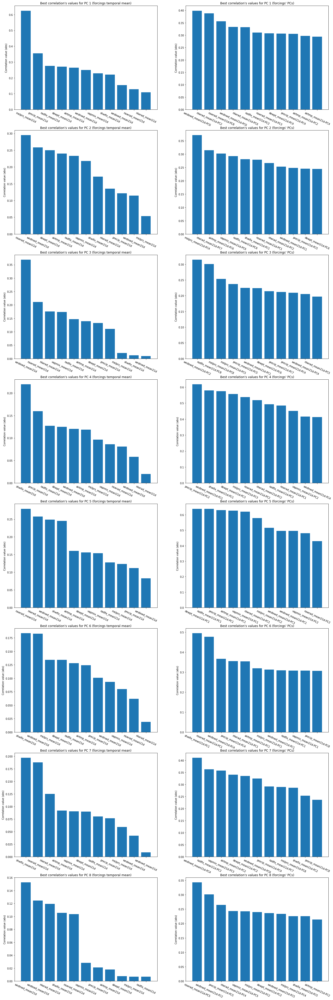

In [47]:
subplot_ranked_correlation([cor_mt_fgs, cor_pcs_fgs], title=["(forcings temporal mean)", "(forcings' PCs)"])

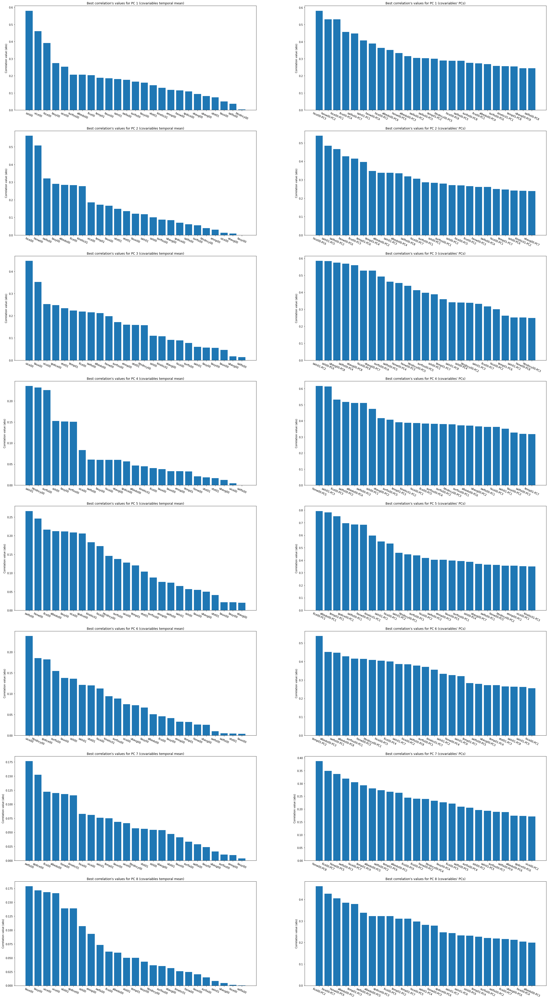

In [73]:
subplot_ranked_correlation([cor_mt_cov, cor_pcs_cov], title=["(covariables temporal mean)", "(covariables' PCs)"])

### Correlation between parameters and error's time series in each geographical point <a class="anchor" id="part3_1_2"></a>

In [86]:
def compute_geo_corr(Xe, X_sel):
    """ Compute the correlation in time between each geographical point and the error
    In:
        Xe     : xarray.core.dataarray.DataArray -- error's time serie (dim (t, y, x))
        X_sel  : dict                            -- parameters' time serie (same area than the error) (dim (t, y, x)) 
    Out:
        xr_cor : dict of xarray.core.dataarray.DataArray 
               -- key = parameter name
                  values dim (y, x) = correlation between  Xe the the associated key
    """
    fields = X_sel.keys()
    t, y, x = Xe.shape
    
    X_2d = dict()
    Xe_2d = np.reshape(Xe.values, (t, x*y))
    
    cor = dict()
    xr_cor = dict()
    
    for field in fields:
        X_2d[field] = np.reshape(X_sel[field], (t, x*y))
        cor[field] = np.empty(x*y)
        for point in range(x*y):
            err_point = Xe_2d[:, point]
            if np.isnan(err_point).any() or not np.any(err_point): #correlation with nan value or constant 0 vector is undefined
                cor[field][point] = np.nan
            else:
                mat = np.corrcoef(err_point, X_2d[field][:, point])
                cor[field][point] = mat[0][1] # NaN values remains for plot
        xr_cor[field] = xr.DataArray(np.reshape(cor[field], (y, x)), dims=['jdim', 'idim'])

    return xr_cor

In [190]:
def subplot_space_cor(list_cor, threshold=0.5, n=10, threshold_sup=1, filepath="", label=["Xe"], plotdiff=True, pick=[], points=[]):
    """
    In:
        cor       : dict of xarray.core.dataarray.DataArray 
                    -- key = parameter name
                       values dim (y, x) = correlation between  Xe the the associated key
       threshold  : float, 0 <= threshold <= 1 
                    -- map for a given field is plot if at least one correlation exceeds this value
        n         : int -- number of best correlation's values to print for each field
        threshold  : float, 0 <= threshold <= 1 
                    -- map for a given field is plot if none of the correlation exceeds this value

    """
    if pick == []:
        fields = list(list_cor[0].keys())
    else:
        fields = pick
        
    ny, nx = list_cor[0][fields[0]].shape
    display = True

    for f in fields:
        if display:
            fig, ax = plt.subplots(ncols=len(list_cor)+plotdiff, figsize=(16,4))
        display = True
        
        cor_abs = np.empty([len(list_cor), ny, nx])
        for nplot, cor in enumerate(list_cor):
            # Highlight n biggest abs correlation values for each plot
            cor_abs[nplot] = np.array(list(map(abs, cor[f])))
            for num, point in enumerate(points):
                if len(points) == 1:
                    ax[nplot].plot(point[0], point[1],'.k') if (len(list_cor) > 1) else plt.plot(point[0], point[1],'.k')
                else:
                    ax[nplot].text(point[0], point[1], num+1) if (len(list_cor) > 1) else plt.text(point[0], point[1], num+1)


            if n > 0:
                cor_abs_1d = cor_abs[nplot].flatten()

                # get index of ranking array (descending order)
                rank_index = np.argsort(cor_abs_1d, axis=-1, kind=None, order=None)[::-1]
                rank_array = cor_abs_1d[rank_index]
                rank_array_nonan = rank_array[np.isfinite(rank_array)]
                rank_index_nonan = rank_index[-(rank_array_nonan.shape[0]):]

                if display and abs(rank_array_nonan[0]) >= threshold and abs(rank_array_nonan[0]) <= threshold_sup:
                    # plot n best results
                    x = [(i % nx) for i in rank_index_nonan[:n]]
                    y = [None for i in range(n)]

                    for i in range(n):
                        y[i] = (rank_index_nonan[i]+1-x[i]) // nx
                        print(f"rank {i+1} : {cor[f].isel(idim=x[i], jdim=y[i]).values} for idim={x[i]}, jdim={y[i]}")
                        #plt.text(x[i], y[i], i+1)
                        ax[nplot].plot(x[i],y[i],'.k') if (len(list_cor) > 1) else plt.plot(x[i],y[i],'.k')

                    #plt.plot(x[0],y[0],'.k')
                    #plt.text(x[0], y[0], 1)
                    if len(list_cor) > 1:
                        cor[f].plot(ax=ax[nplot], vmax=1)
                        ax[nplot].set_title("Geographical correlation" + "\n" + f"between {label[nplot]} and {f}'s' time series", multialignment='center')
                    else:
                        cor[f].plot(vmax=1)
                        plt.title(f"Geographical correlation between {label[0]} and {f}'s' time series", multialignment='center');
                else:
                    display = False
            else:
                if len(list_cor) > 1:
                    cor[f].plot(ax=ax[nplot], vmax=1)
                    ax[nplot].set_title("Geographical correlation" + "\n" + f"between {label[nplot]} and {f}'s' time series")
                else:
                    cor[f].plot(vmax=1)
                    plt.title("Geographical correlation" + "\n" + f"between {label[0]} and {f}'s' time series");

            if filepath != "":
                plt.savefig(f"{filepath}/{f}.png", facecolor="white")        
        if display:
            
            diff = xr.DataArray(cor_abs[0], dims=['jdim', 'idim']) - xr.DataArray(cor_abs[1], dims=['jdim', 'idim'])
            diff.plot(ax=ax[len(list_cor)], vmax=1)
            ax[len(list_cor)].set_title(f"{f} :" + "\n" + f"abs(cor with {label[0]}) - abs(cor with {label[1]})")
            
            
            plt.show()

In [ ]:
geo_cor_fgs = compute_geo_corr(Xe, forcings)
geo_cor_cov = compute_geo_corr(Xe, X_sel_cov)

In [16]:
Xe_rec_reshape = Xe_rec.transpose('rdim', 'jdim', 'idim')
geo_cor_fgs_rec = compute_geo_corr(Xe_rec_reshape, forcings)
geo_cor_cov_rec = compute_geo_corr(Xe_rec_reshape, X_sel_cov)

In [ ]:
# Compute the correlation between :
## LEFT : error's time serie and parameters' time series
## CENTER : error's reconstruct with PCs and EOF time serie and parameters' time serie
## RIGHT : correlation difference between the two previous plots (blue: best correlation for the reconstructed error)

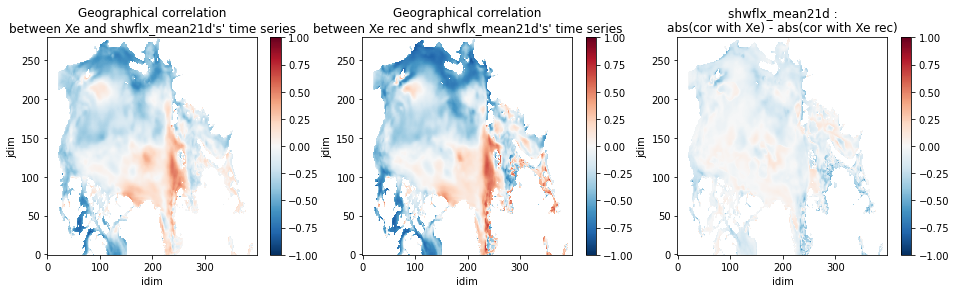

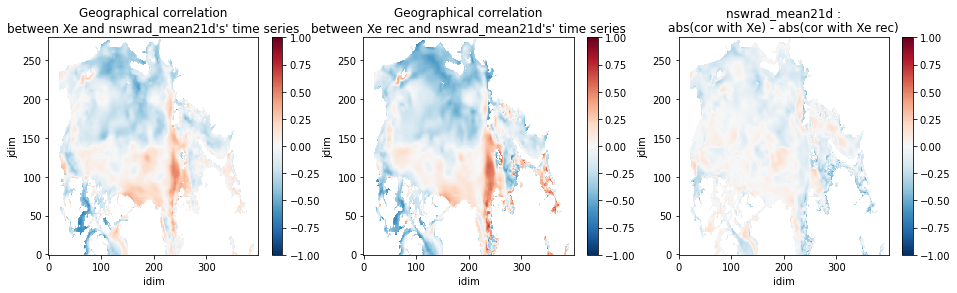

In [24]:
# Forcings
subplot_space_cor([geo_cor_fgs, geo_cor_fgs_rec], n=0, label=["Xe", "Xe rec"], pick=["shwflx_mean21d","nswrad_mean21d"])

In [244]:
def compare_ts(i, j, X, param, cov, label, param_name=''):
    t = param.shape[0]
    fig, ax = plt.subplots(ncols=len(X), figsize=(18,2))

    for index in range(len(X)):
        print(f"{label[index]} : correlation value = {cov[index].sel(jdim=slice(*(j, j+1)),idim=slice(*(i, i+1))).values[0]}")

        if type(X[index]) != np.ndarray:
            err = np.reshape(X[index].sel(jdim=slice(*(j, j+index)),idim=slice(*(i, i+index))).values, (t))
        else:
            err = np.reshape(X[index][:, j, i], (t))
        par = np.reshape(param[:, j, i], (t))

        ax[index].set_title(f"{param_name} - {label[index]}")
        ax[index].plot(err, color='red', label=label[index])
        ax_twin = ax[index].twinx()
        ax_twin.plot(par, color='blue', label=param_name)
        ax[index].legend(loc="upper right")
        ax_twin.legend(loc="upper right")
    plt.show()

In [ ]:
Xe_mask = np.ma.array(Xe.values, mask=np.isnan(Xe.values)) # Use a mask to mark the NaNs
Xe_norm = (Xe_mask - np.mean(Xe_mask)) / (np.std(Xe_mask) * Xe_mask.shape[0])
                                          
Xe_rec_mask = np.ma.array(Xe_rec_reshape.values, mask=np.isnan(Xe_rec_reshape.values))
Xe_rec_norm = (Xe_rec_mask - np.mean(Xe_rec_mask)) / (np.std(Xe_rec_mask) * Xe_rec_mask.shape[0])

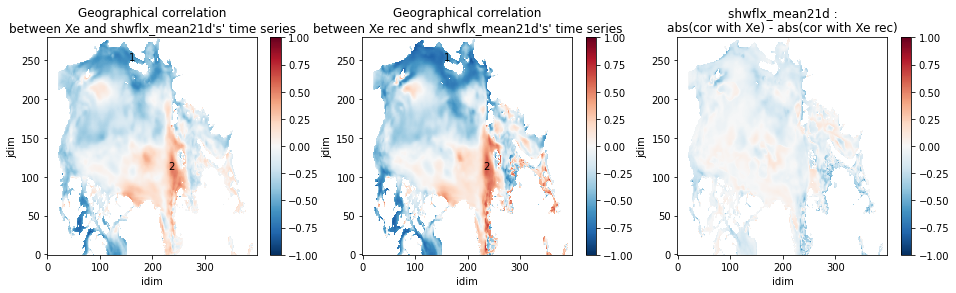

Xe_rec : correlation value = [-0.71442085]
Xe : correlation value = [-0.60794714]


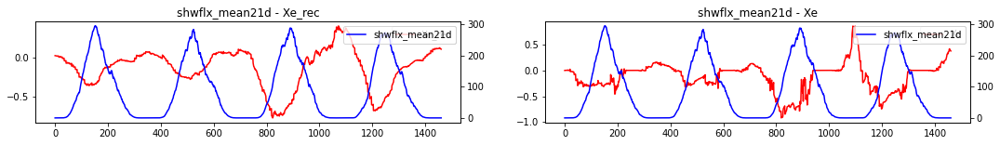

Xe_rec : correlation value = [0.412675]
Xe : correlation value = [0.30086964]


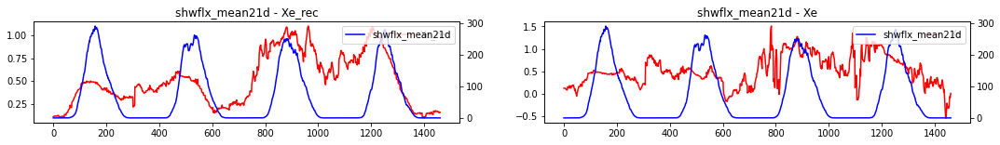

Xe_rec : correlation value = [-0.71442085]
Xe : correlation value = [-0.60794714]


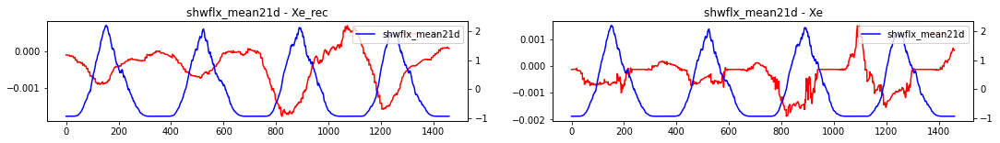

In [245]:
param = "shwflx_mean21d"
points = [(155, 250), (230, 110)]
subplot_space_cor([geo_cor_fgs, geo_cor_fgs_rec], n=0, label=["Xe", "Xe rec"], pick=[param], points=points)
for point in points:
    compare_ts(point[0], point[1], [Xe_rec_reshape, Xe], forcings[param], [geo_cor_fgs_rec[param], geo_cor_fgs[param]], ["Xe_rec", "Xe"], param)

fgs_norm = (forcings[param] - np.mean(forcings[param])) /  np.std(forcings[param])
compare_ts(155, 250, [Xe_rec_norm.data, Xe_norm.data], fgs_norm, [geo_cor_fgs_rec[param], geo_cor_fgs[param]], ["Xe_rec", "Xe"], param)

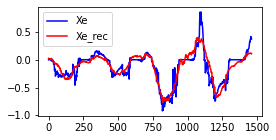

In [206]:
i, j = 155, 250
fig, ax = plt.subplots(figsize=(4, 2))
plt.plot(np.reshape(Xe.sel(jdim=slice(*(j, j+1)),idim=slice(*(i, i+1))).values, (1461)), color="blue", label="Xe")
plt.plot(np.reshape(Xe_rec.sel(jdim=slice(*(j, j)),idim=slice(*(i, i))).values, (1461)), color="red", label="Xe_rec")
plt.legend(loc="upper left")

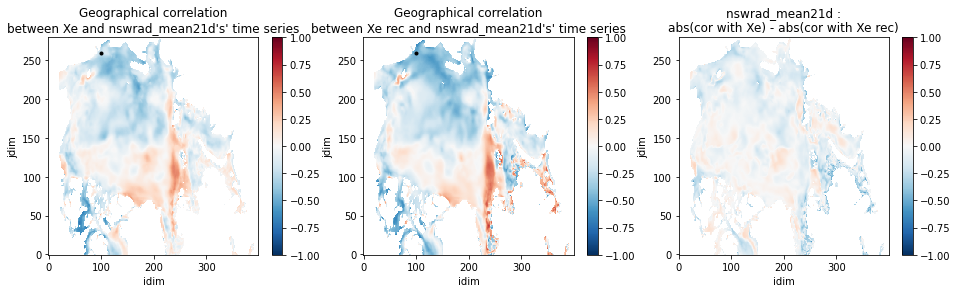

Xe_rec : correlation value = [-0.46421731]
Xe : correlation value = [-0.22188367]


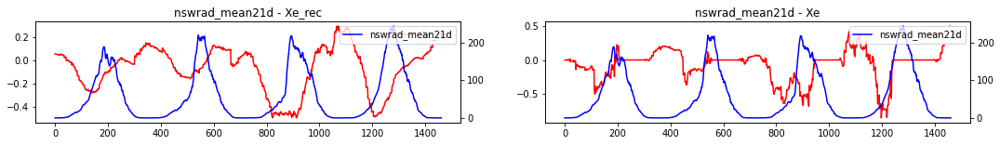

In [246]:
param = "nswrad_mean21d"
points = [(100, 260)]
subplot_space_cor([geo_cor_fgs, geo_cor_fgs_rec], n=0, label=["Xe", "Xe rec"], pick=[param], points=points)
for point in points:
    compare_ts(point[0], point[1], [Xe_rec_reshape, Xe], forcings[param], [geo_cor_fgs_rec[param], geo_cor_fgs[param]], ["Xe_rec", "Xe"], param)

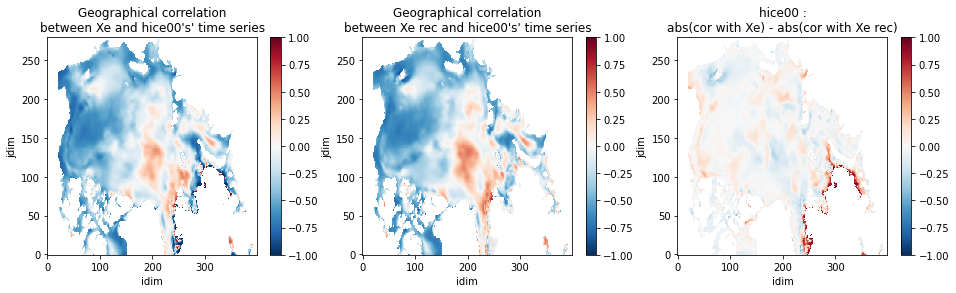

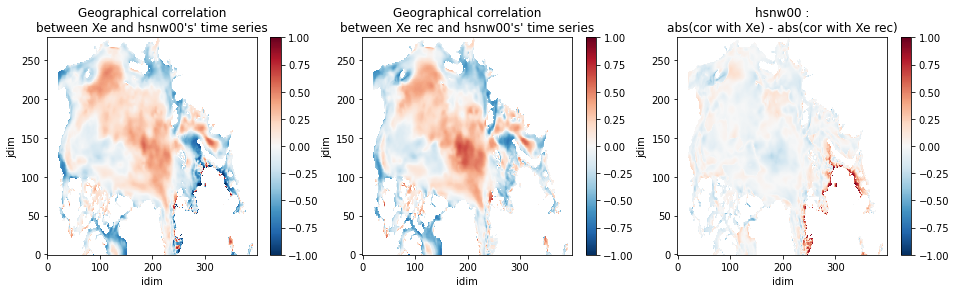

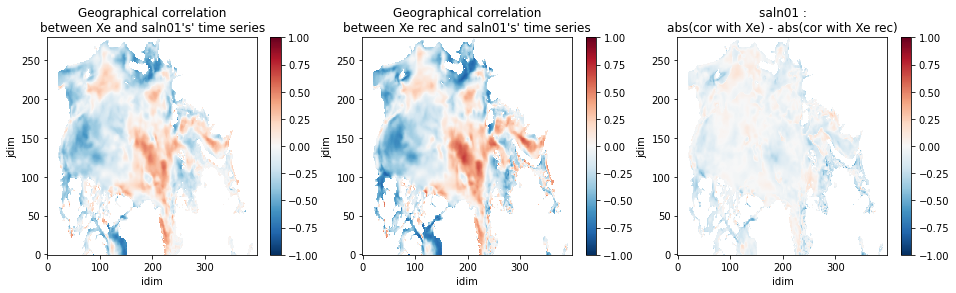

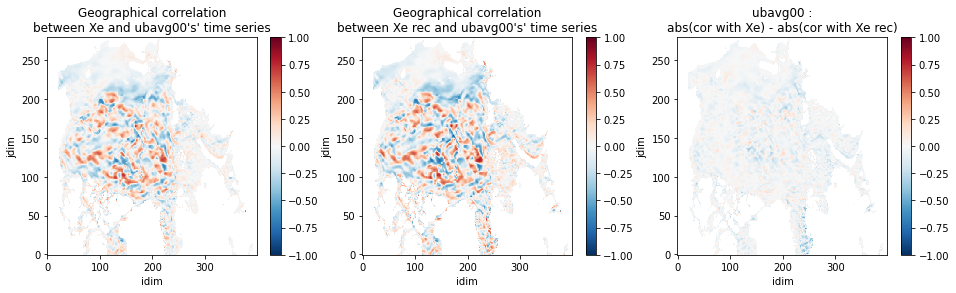

In [119]:
# Covariables
subplot_space_cor([geo_cor_cov, geo_cor_cov_rec], n=0, label=["Xe", "Xe rec"], pick=["hice00", "hsnw00", "saln01", "ubavg00"])

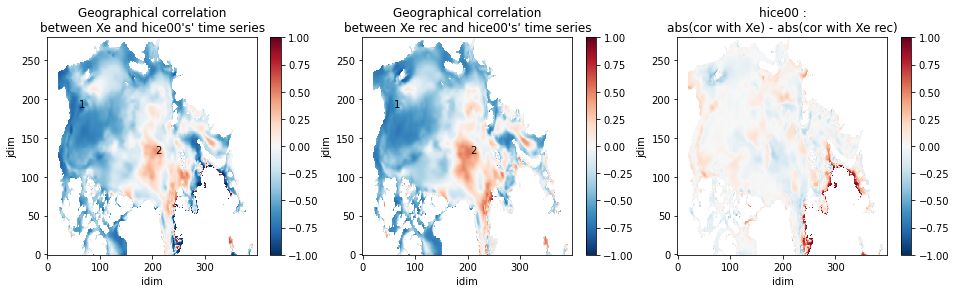

Xe_rec : correlation value = [-0.67158805]
Xe : correlation value = [-0.7503951]


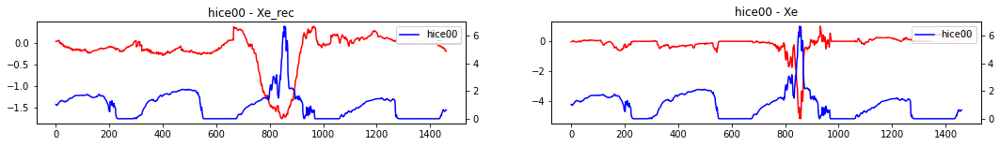

Xe_rec : correlation value = [0.52655394]
Xe : correlation value = [0.42213182]


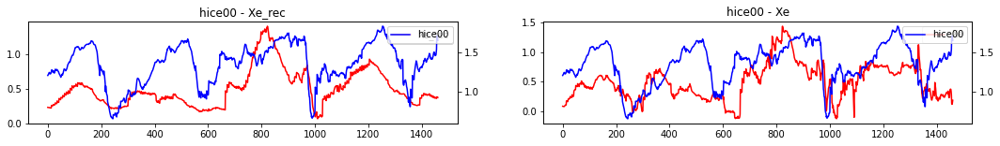

In [247]:
param = "hice00"
points = [(60, 190), (205, 130)] #(48, 160)
subplot_space_cor([geo_cor_cov, geo_cor_cov_rec], n=0, label=["Xe", "Xe rec"], pick=[param], points=points)
for point in points:
    compare_ts(point[0], point[1], [Xe_rec_reshape, Xe], X_sel_cov[param], [geo_cor_cov_rec[param], geo_cor_cov[param]], ["Xe_rec", "Xe"], param)

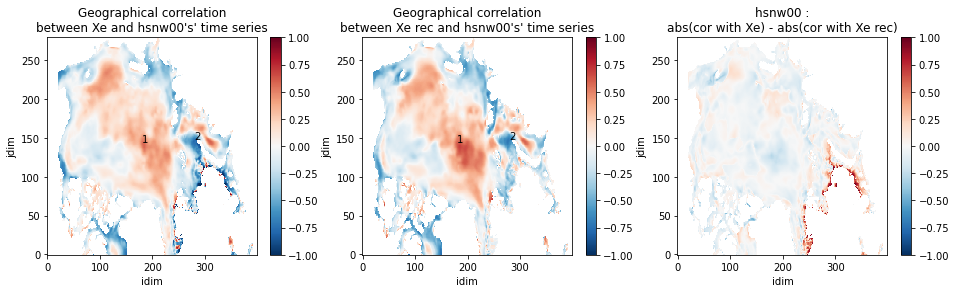

Xe_rec : correlation value = [0.56843967]
Xe : correlation value = [0.51881975]


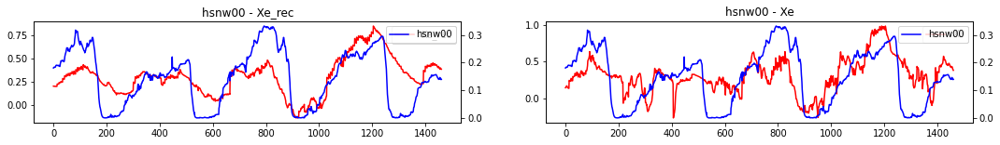

Xe_rec : correlation value = [-0.67529443]
Xe : correlation value = [-0.7308661]


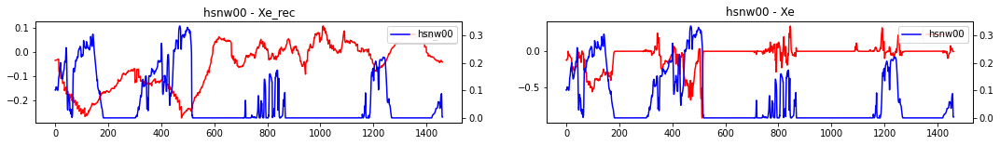

In [248]:
param = "hsnw00"
points = [(180, 145), (280, 148)]
subplot_space_cor([geo_cor_cov, geo_cor_cov_rec], n=0, label=["Xe", "Xe rec"], pick=[param], points=points)
for point in points:
    compare_ts(point[0], point[1], [Xe_rec_reshape, Xe], X_sel_cov[param], [geo_cor_cov_rec[param], geo_cor_cov[param]], ["Xe_rec", "Xe"], param)

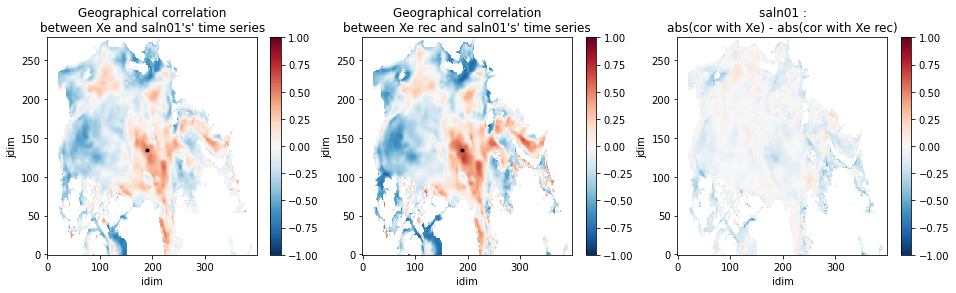

Xe_rec : correlation value = [0.59631942]
Xe : correlation value = [0.45500419]


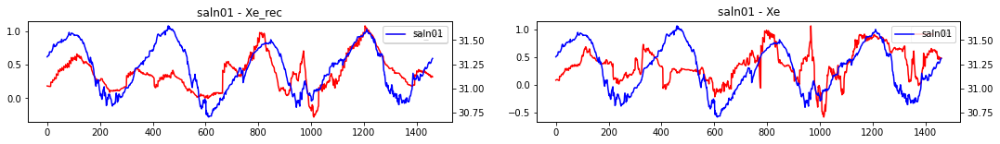

Xe_rec : correlation value = [0.59631942]
Xe : correlation value = [0.45500419]


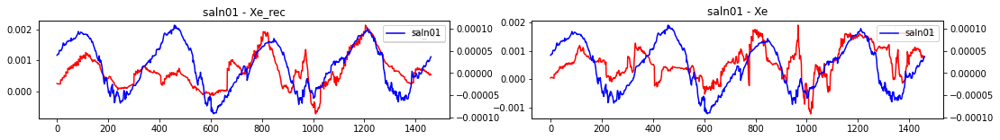

In [249]:
param = "saln01"
points = [(190, 135)]#, (80, 150), (140, 20), (205, 240)]
subplot_space_cor([geo_cor_cov, geo_cor_cov_rec], n=0, label=["Xe", "Xe rec"], pick=[param], points=points)

cov_mask = np.ma.array(X_sel_cov[param], mask=np.isnan(X_sel_cov[param]))
cov_norm = (cov_mask - np.mean(cov_mask)) / (np.std(cov_mask) * cov_mask.shape[0])

for point in points:
    compare_ts(point[0], point[1], [Xe_rec_reshape, Xe], X_sel_cov[param], [geo_cor_cov_rec[param], geo_cor_cov[param]], ["Xe_rec", "Xe"], param)
    compare_ts(point[0], point[1], [Xe_rec_norm.data, Xe_norm.data], cov_norm, [geo_cor_cov_rec[param], geo_cor_cov[param]], ["Xe_rec", "Xe"], param)

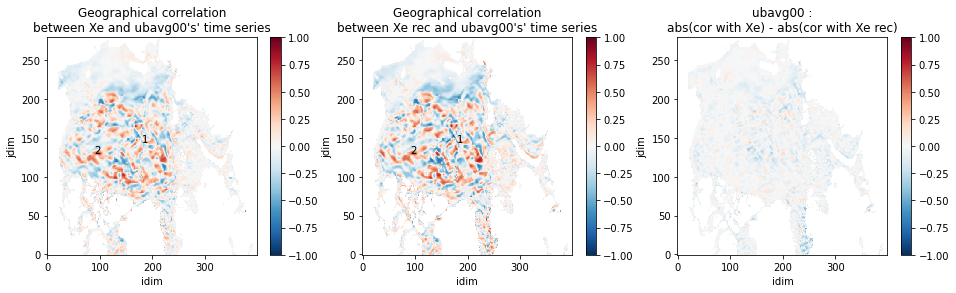

Xe_rec : correlation value = [-0.53574234]
Xe : correlation value = [-0.3928146]


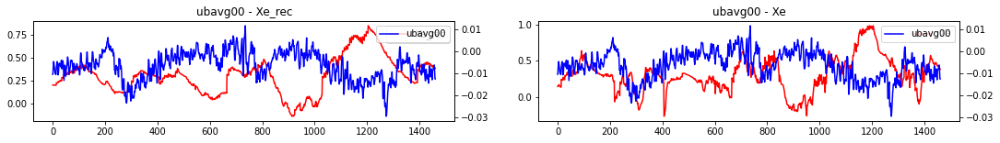

Xe_rec : correlation value = [0.47064179]
Xe : correlation value = [0.49062437]


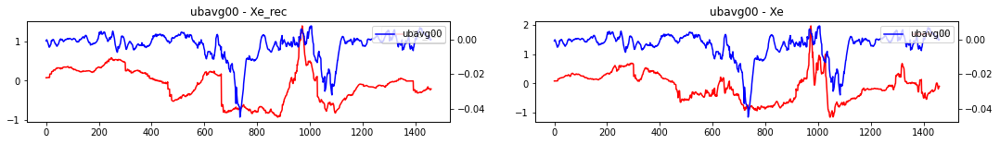

In [250]:
param = "ubavg00"
points = [(180, 145), (90, 130)]
subplot_space_cor([geo_cor_cov, geo_cor_cov_rec], n=0, label=["Xe", "Xe rec"], pick=[param], points=points)
for point in points:
    compare_ts(point[0], point[1], [Xe_rec_reshape, Xe], X_sel_cov[param], [geo_cor_cov_rec[param], geo_cor_cov[param]], ["Xe_rec", "Xe"], param)

In [257]:
def lookpoint(point, cors, labels, Xs, Xpar):
    for f in cors[0].keys():
        subplot_space_cor(cors, n=0, label=labels, pick=[f], points=[point])
        compare_ts(point[0], point[1], Xs, Xpar[f], [cors[0][f], cors[1][f]], labels, f)

## Try to find similarities in the temporal evolution <a class="anchor" id="part3_3"></a>

As we have 3D data (t, y, x) and it's a spectral analysis tool, basic function are developed for 1D time serie.

Differents option to do so :
-  __TODO__ : find how to calculate in a relevant way for 2Dspace + 1Dtime data
- Transform our data into 1D
    - Mean of all spatial data at each time [mean(t1) ... mean(tn)] : t values
    - Use x*y time serie to have the temporal evolution in each point (not relevant for vizualization/computing time?)
    -  __TODO__ : identify areas where the points have similar behavior to limit the number of time series



### Autocorrelation (on reverse time serie) <a class="anchor" id="part3_3_1"></a>

Study the correlation of a time series with itself at different times. Calculation on reverse time series to see the links with future versions (and eventually go back in time)

### Cross correlation <a class="anchor" id="part3_3_2"></a>
Study the links between different time series : between the evolution of the differents parameters and the error

In [13]:
from statsmodels.tsa.stattools import ccf

# problem : we have dims (t, space) with space = vectorization of (x, y) and we need only 1 dim
    ## sol 1 : compute mean for each time (t time series)
    ## TODO : code function for good dims

def compute_crosscorr(X, Xp_nonan):
    """ Plot the autocorrelation of the given data.
        As given data is 3D (t, y, x) and this function is for the moment only for 1D data,
        it's computing the crosscorrelation for mean between each point.
    In:
        X        : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
        X_fields : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
    """
    fields = list(Xp_nonan.keys())
    
    # Compute mean for X
    if type(X) is np.ndarray:
        X_nonan = X[np.isfinite(X)]
    else:
        X_nonan = X.values[np.isfinite(X.values)]
        
    dims = (X.shape[0], X_nonan.shape[0]//X.shape[0])
    X_nonan = np.reshape(X_nonan, dims)
    X_space_mean = np.array([np.mean(X_nonan[t]) for t in range(X_nonan.shape[0])])
    
    ccor_time = dict()
    for field in fields:
        Xp_space_mean = np.array([np.mean(Xp_nonan[field][t]) for t in range(dims[0])])
        ccor_time[field] = np.concatenate((ccf(X_space_mean, Xp_space_mean[::-1]), ccf(X_space_mean, Xp_space_mean)))
        
    return ccor_time

In [14]:
ccor_fgs = compute_crosscorr(Xe, X_sel_nonan_fgs)
ccor_cov = compute_crosscorr(Xe, X_sel_nonan_cov)

In [23]:
def plot_crosscor(cor, maxval=None, timestep=365):
    fields = list(cor.keys())
    n = (cor[fields[0]].shape[0]) // 2
    
    if maxval == None:
        maxval = n
        pltcor = cor
    else:
        pltcor = dict([(f, cor[f][n-maxval:n+maxval]) for f in fields])
    for field in fields:
        fig, ax = plt.subplots(figsize=(12,6))
        plt.axvline(x=0, linestyle='--', color='black')
        plt.plot(np.arange(-maxval, maxval), pltcor[field])

        plt.ylabel('Crosscorrelation value (abs)')
        plt.title(f'Crosscorrelation between {field} and Xe')

        for i in range(0, maxval, timestep):
            plt.axvline(x=i, linestyle='dotted', color='grey')
            plt.axvline(x=-i, linestyle='dotted', color='grey')
        plt.show()

In [16]:
def sub_periodic_mean(period, ar):
    """ Compute the mean between each each element spaced by "period" element, and subtract it to them
    In:
        period :
        ar     : -- 1D array
    """
    
    means = np.empty(period)
    
    # Compute the mean between each element spaced by "period"
    for elem in range(period):
        means[elem] = np.array(np.mean([i for i in ar[elem::period]]))

    # Subtract this mean
    return np.array([ar[i]-means[i%period] for i in range(ar.shape[0])])


def sub_periodic_mean_3d(period, ar):
    result = dict()
    for f in forcings.keys():
        result[f] = sub_periodic_mean(365, X_sel_nonan_fgs[f])

        final_array = np.empty(ar.shape)
        for y in range(ar.shape[1]):
            for x in range(ar.shape[2]):
                final_array[:, y, x] = sub_periodic_mean(period, ar[:, y, x])
    return result

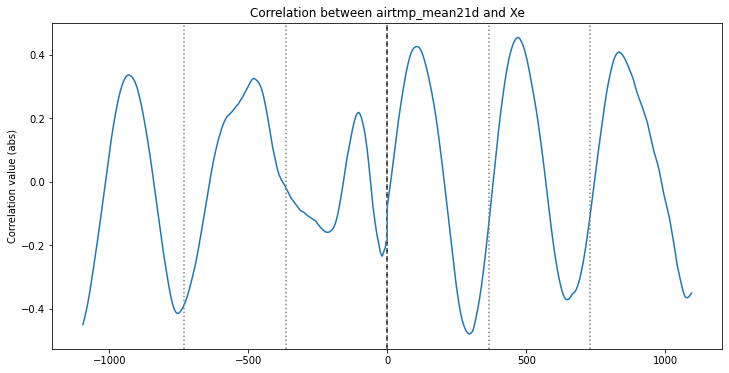

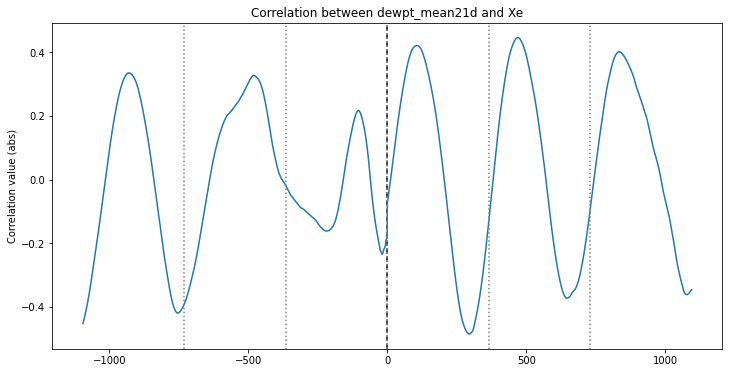

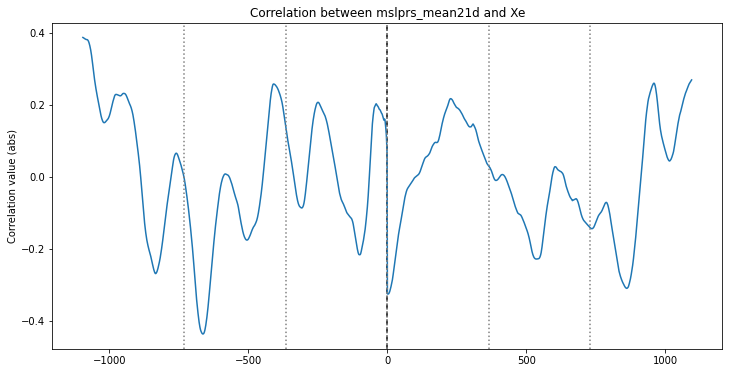

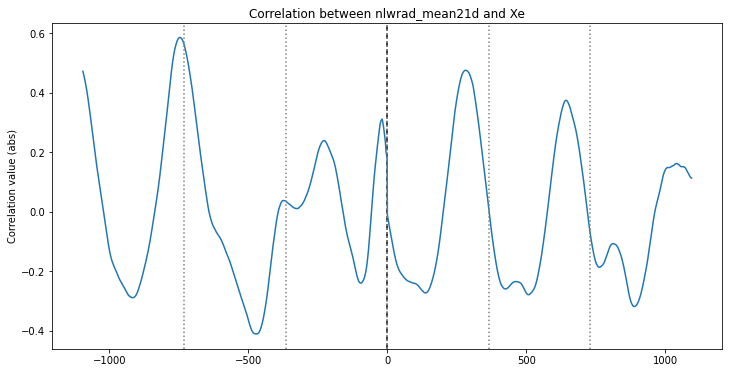

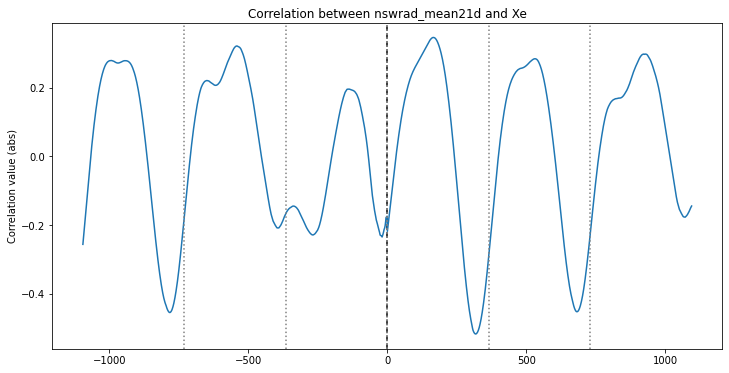

...

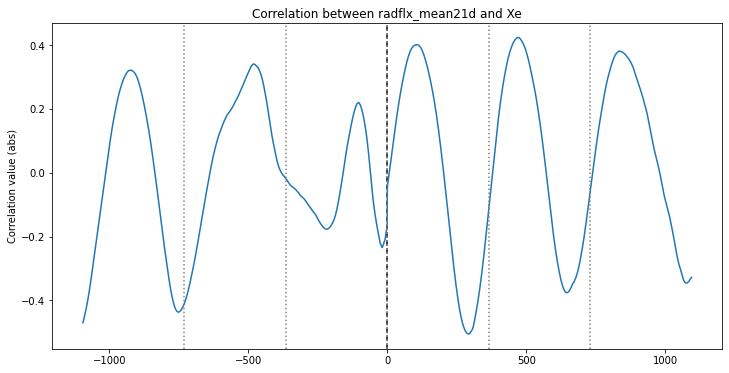

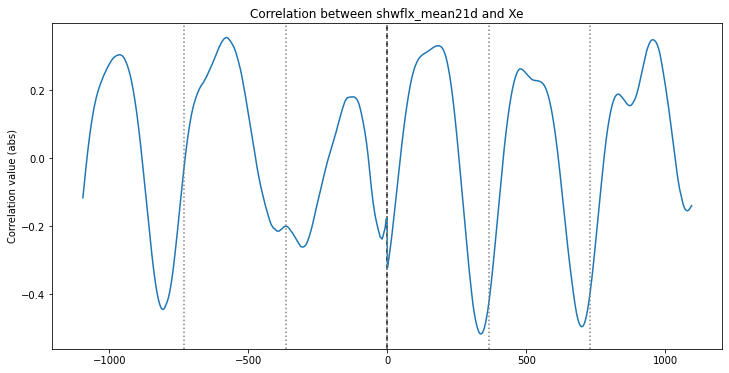

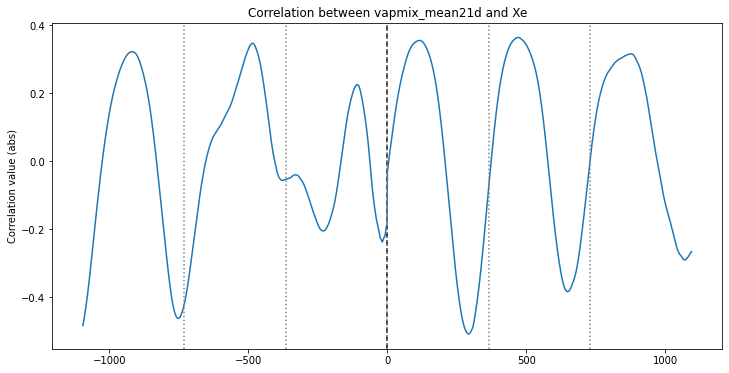

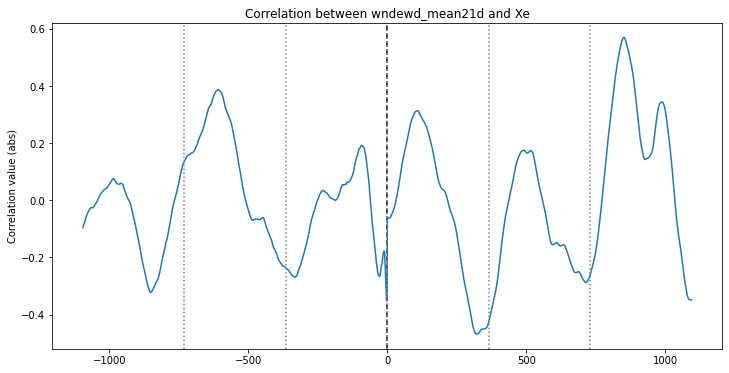

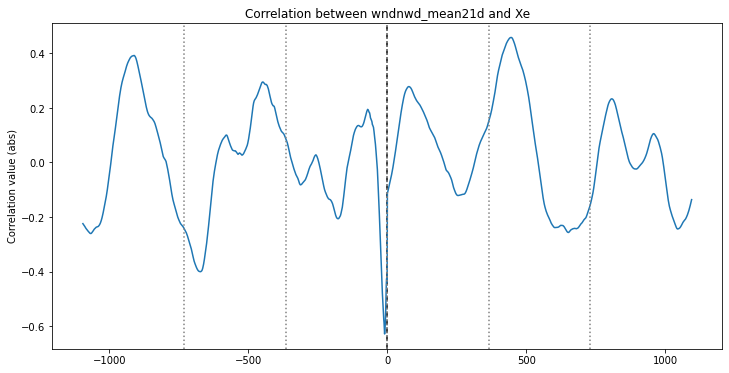

In [342]:
plot_crosscor(ccor_fgs, 365*3)

In [17]:
fgs_m = dict()
for f in forcings.keys():
    fgs_m[f] = sub_periodic_mean(365, X_sel_nonan_fgs[f])
    
cov_m = dict()
for f in X_sel_nonan_cov.keys():
    cov_m[f] = sub_periodic_mean(365, X_sel_nonan_cov[f])

ccor_fgsm = compute_crosscorr(Xe, fgs_m)
ccor_covm = compute_crosscorr(Xe, cov_m)

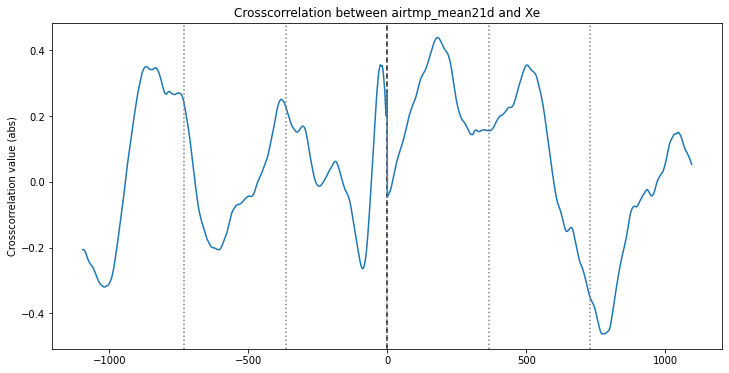

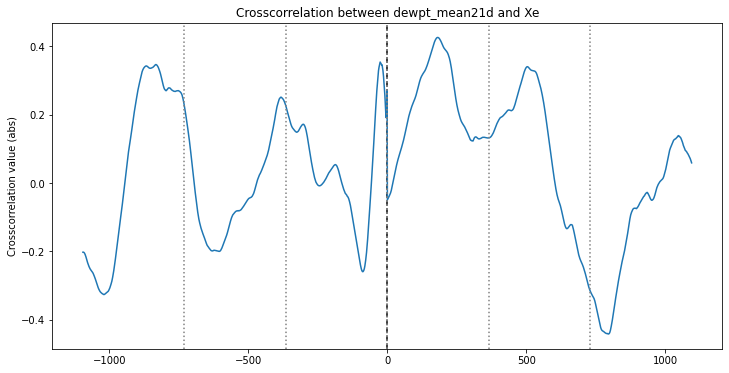

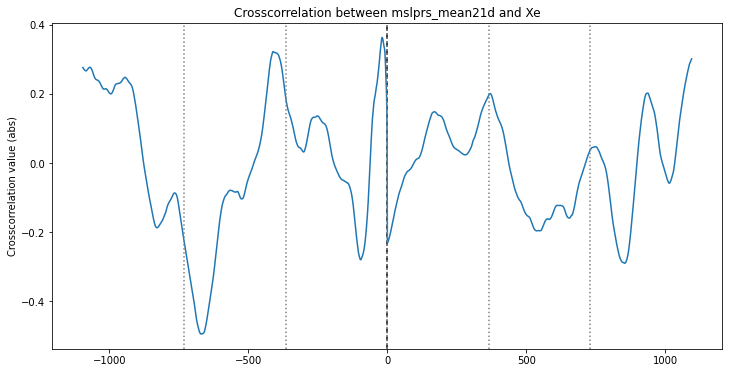

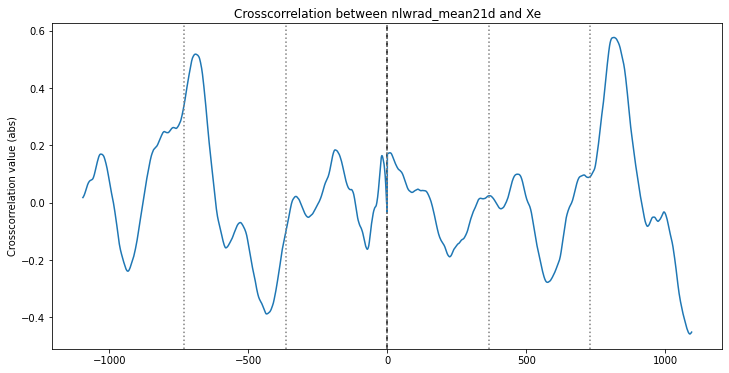

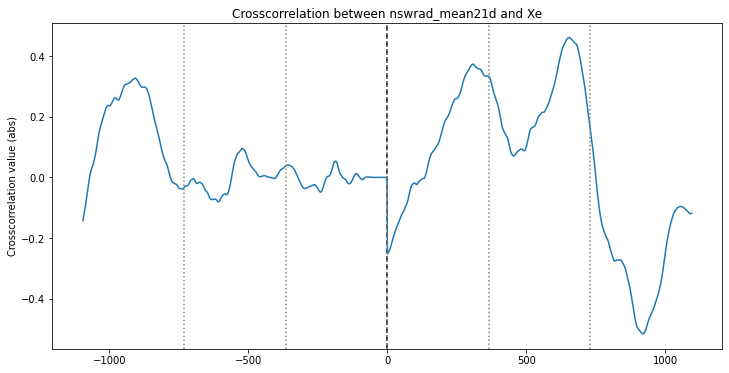

...

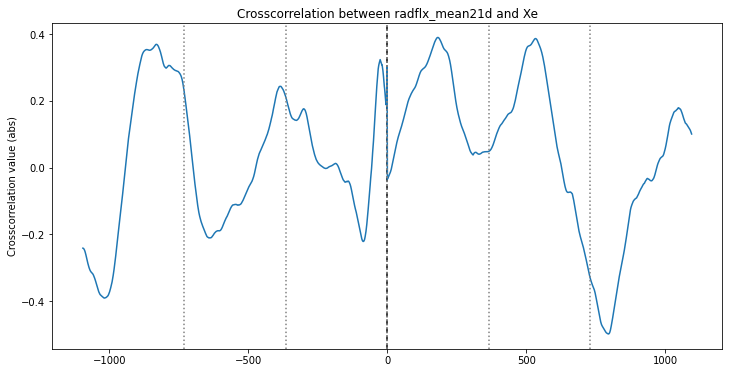

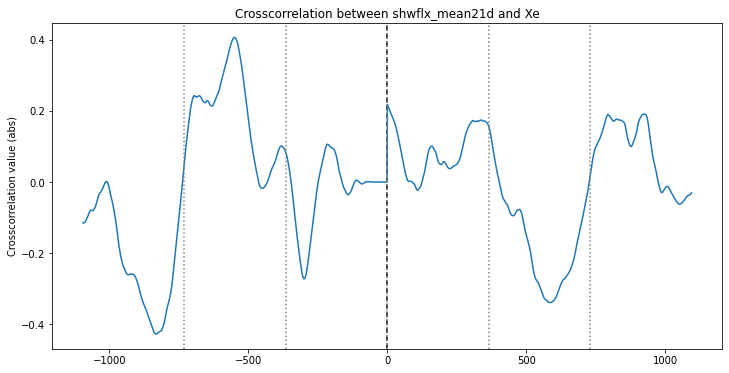

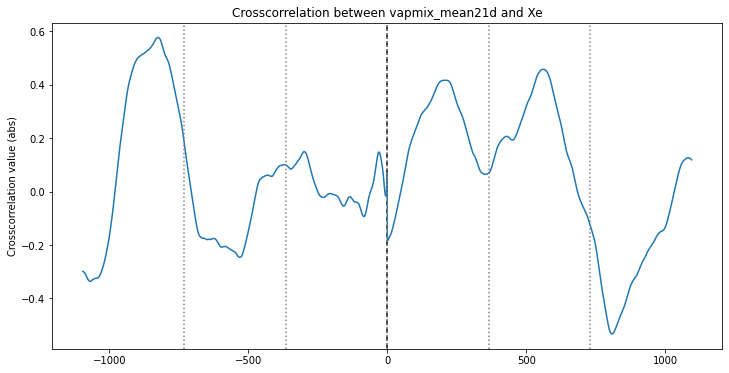

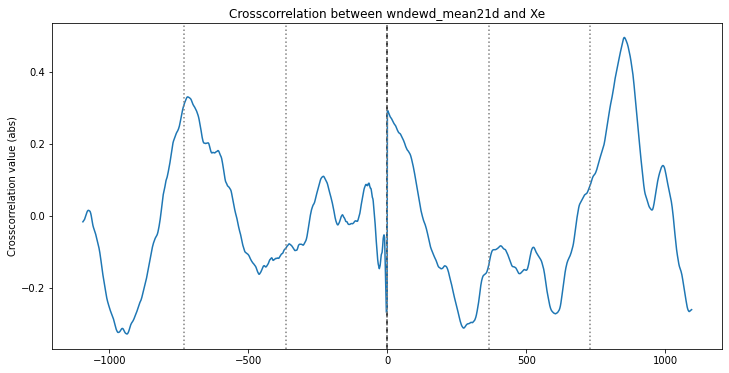

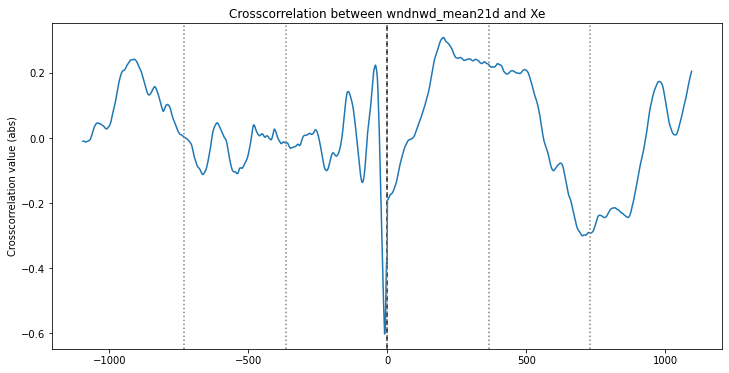

In [24]:
plot_crosscor(ccor_fgsm, 365*3)

In [ ]:
## DRAFT, UNTEST YET

In [35]:
from scipy.signal import correlate2d

def compute_crosscorr_2D(X, Xp_nonan):
    """ Plot the autocorrelation of the given data.
        As given data is 3D (t, y, x) and this function is for the moment only for 1D data,
        it's computing the crosscorrelation for mean between each point.
    In:
        X        : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
        X_fields : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
    """
    fields = list(Xp_nonan.keys())
    
    # Compute mean for X
    if type(X) is np.ndarray:
        X_nonan = X[np.isfinite(X)]
    else:
        X_nonan = X.values[np.isfinite(X.values)]
        
    dims = (X.shape[0], X_nonan.shape[0]//X.shape[0])
    X_nonan = np.reshape(X_nonan, dims)
    
    #ccor_time = dict()
    #for field in fields:
    #    ccor_time[field] = correlate2d(X_nonan, Xp_nonan[field])
    #return ccor_time
    return correlate2d(X_nonan, Xp_nonan["airtmp_mean21d"])

In [ ]:
ccor_fgs_2d = compute_crosscorr_2D(Xe, X_sel_nonan_fgs)

In [ ]:
y, x = np.unravel_index(np.argmax(ccor_fgs_2d), ccor_fgs_2d.shape)  # find the match

fig, ax = plt.subplots(figsize=(12,6))
ax.imshow(ccor_fgs_2d, cmap='gray')
ax.set_title('Cross-correlation')
ax.set_axis_off()
ax.plot(x, y, 'ro')
fig.show()

In [ ]:
## DRAFT, UNTEST YET

In [ ]:
# Study of a specific point

In [ ]:
point1 = (60, 190)

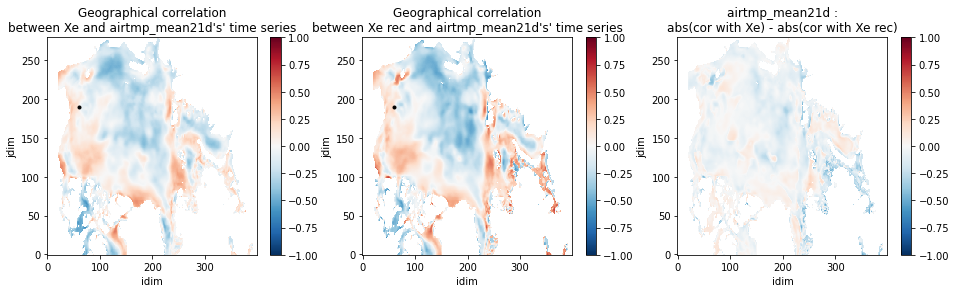

Xe : correlation value = [0.05312277]
Xe rec : correlation value = [0.12379786]


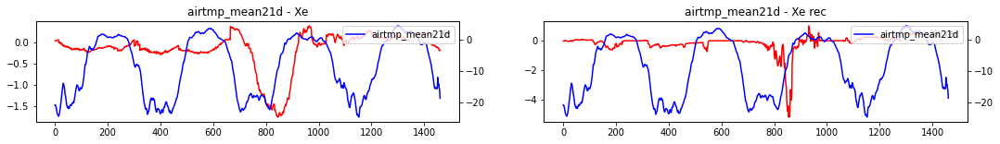

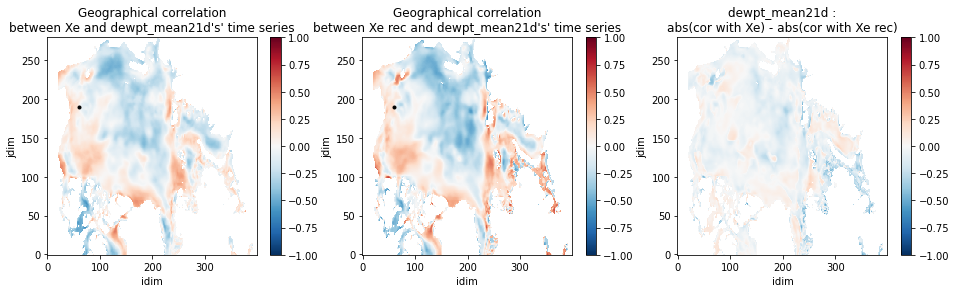

Xe : correlation value = [0.04657822]
Xe rec : correlation value = [0.11894771]


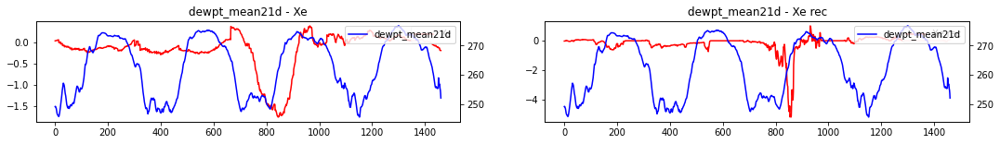

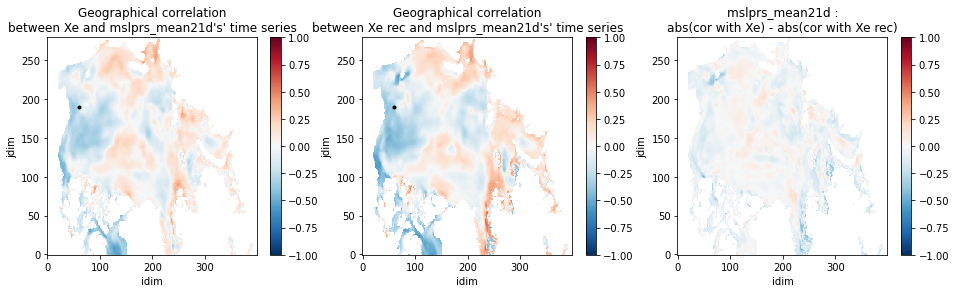

Xe : correlation value = [-0.20124775]
Xe rec : correlation value = [-0.32261794]


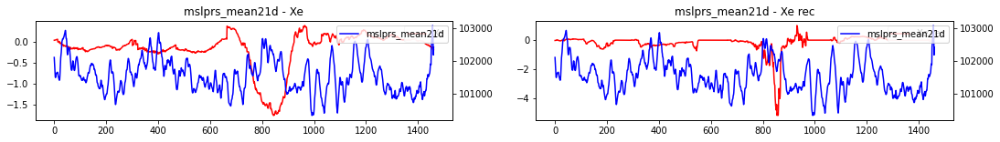

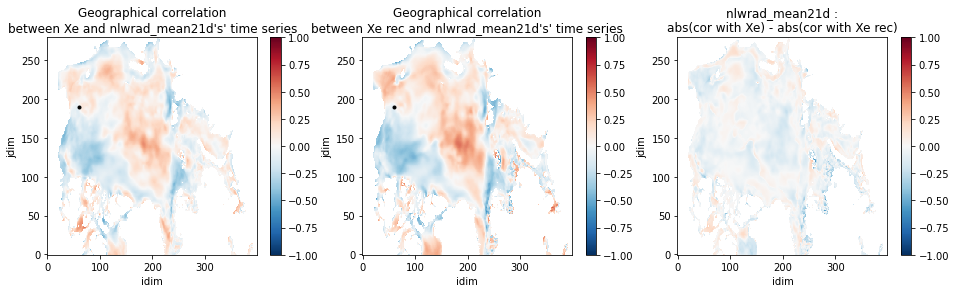

Xe : correlation value = [-0.01731194]
Xe rec : correlation value = [-0.07467275]


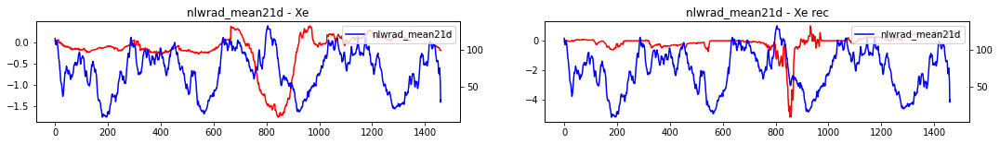

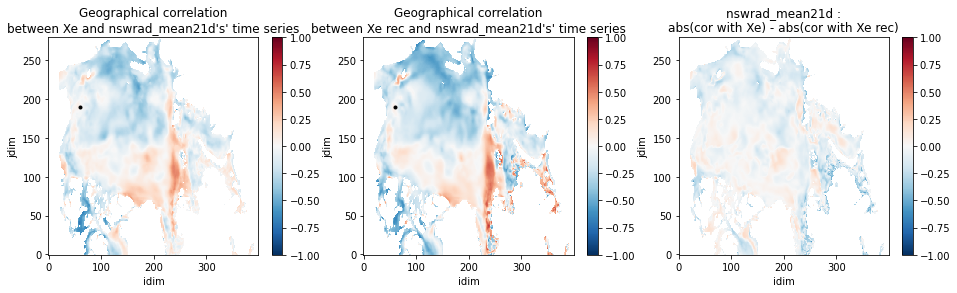

Xe : correlation value = [0.02455556]
Xe rec : correlation value = [0.03972475]


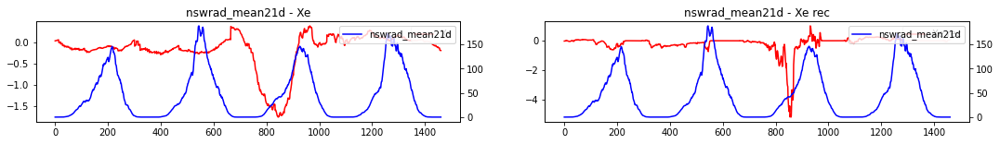

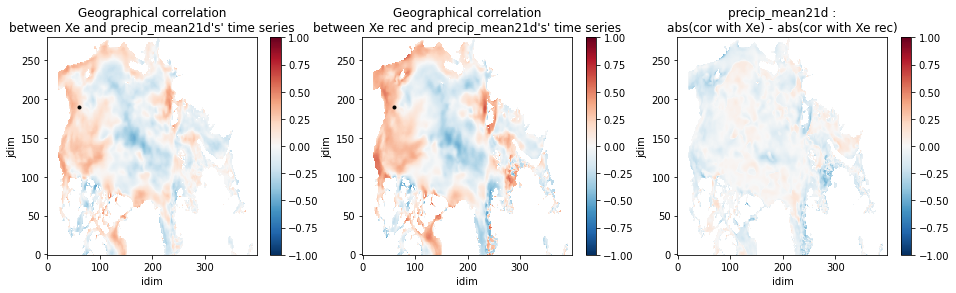

Xe : correlation value = [0.19041037]
Xe rec : correlation value = [0.25247293]


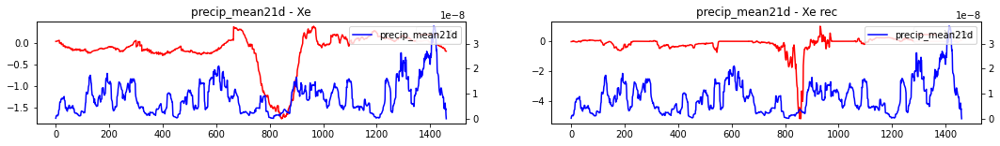

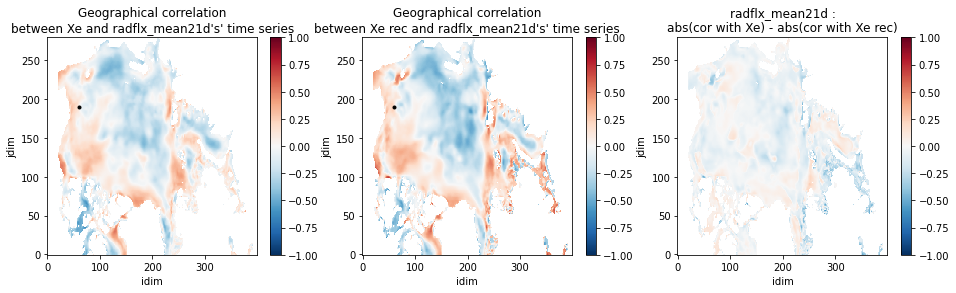

Xe : correlation value = [0.06169881]
Xe rec : correlation value = [0.14746095]


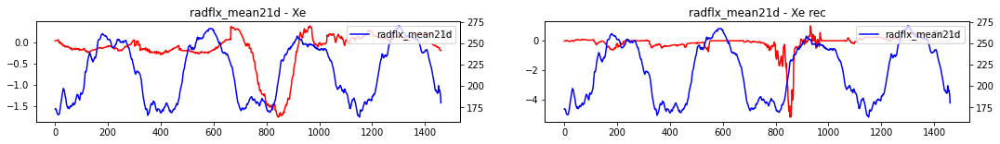

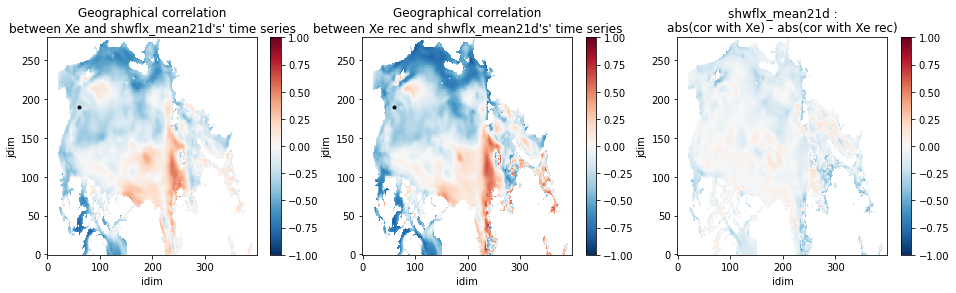

Xe : correlation value = [-0.20227476]
Xe rec : correlation value = [-0.24042589]


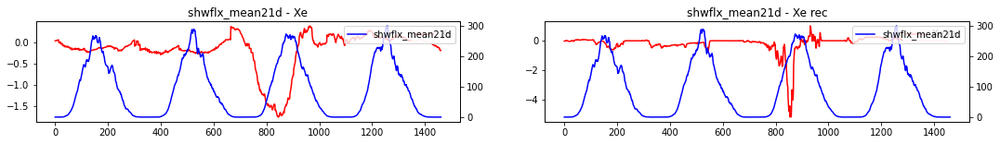

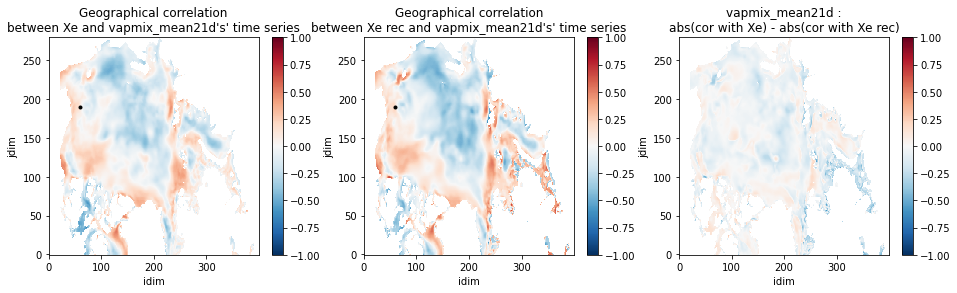

Xe : correlation value = [0.06998861]
Xe rec : correlation value = [0.12634156]


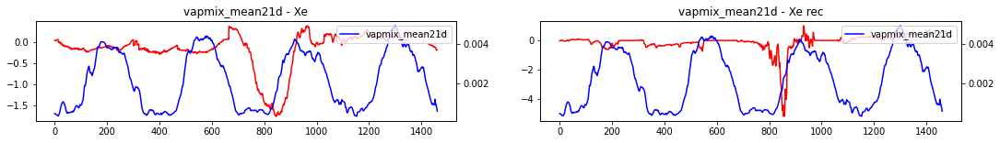

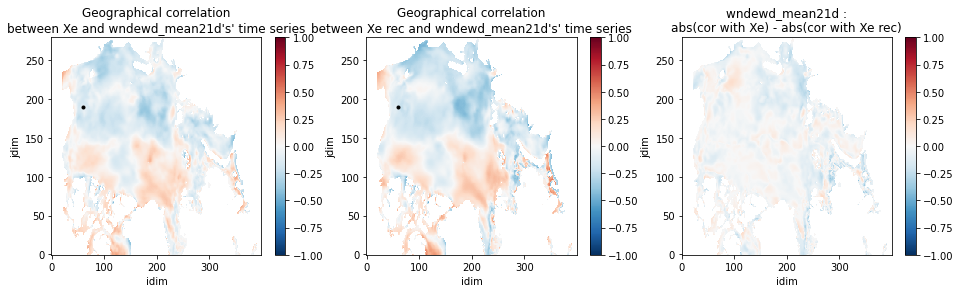

Xe : correlation value = [-0.11441574]
Xe rec : correlation value = [-0.18710488]


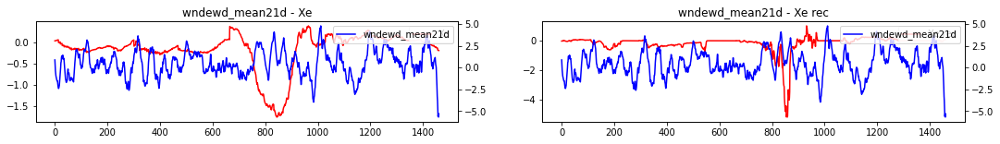

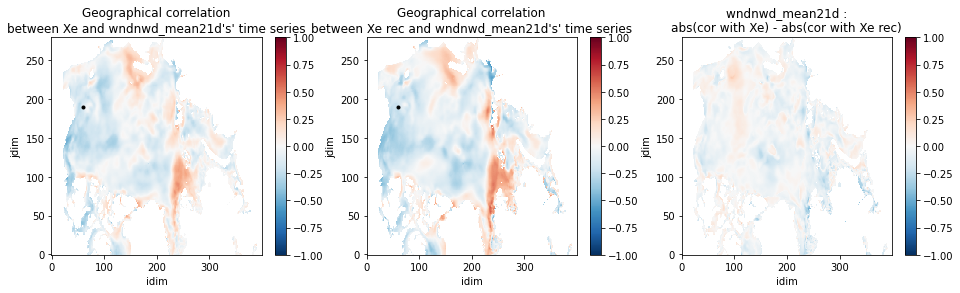

Xe : correlation value = [-0.12656204]
Xe rec : correlation value = [-0.2214829]


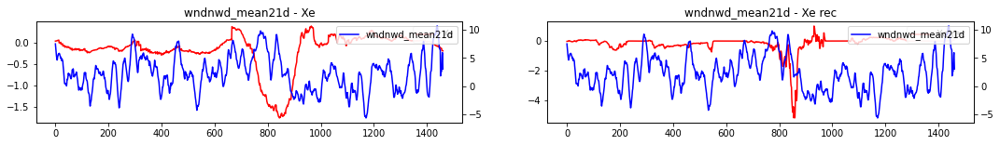

In [258]:
lookpoint(point1, [geo_cor_fgs, geo_cor_fgs_rec], ["Xe", "Xe rec"], [Xe_rec_reshape, Xe], forcings)

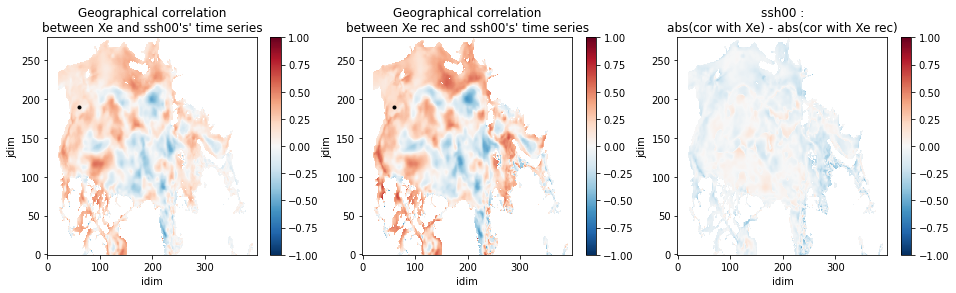

Xe : correlation value = [0.12755038]
Xe rec : correlation value = [-0.14939643]


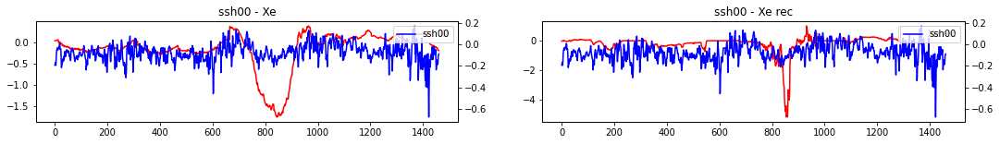

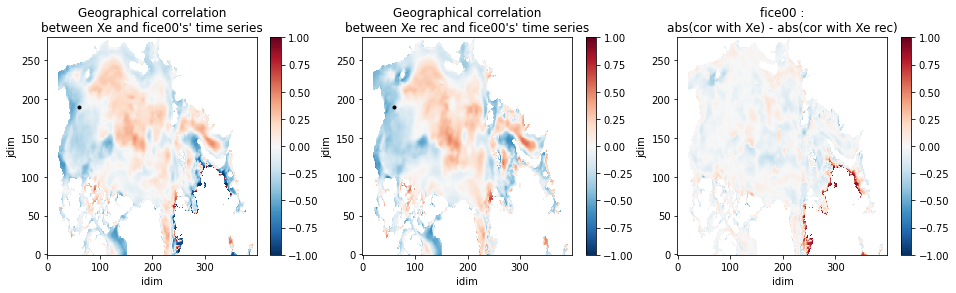

Xe : correlation value = [-0.20918694]
Xe rec : correlation value = [-0.14939643]


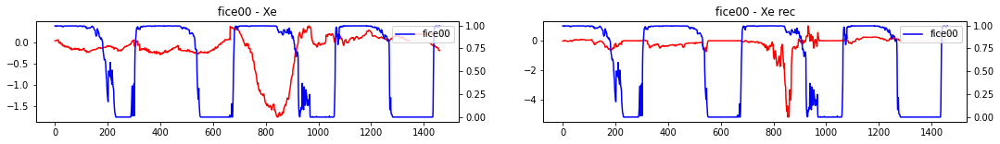

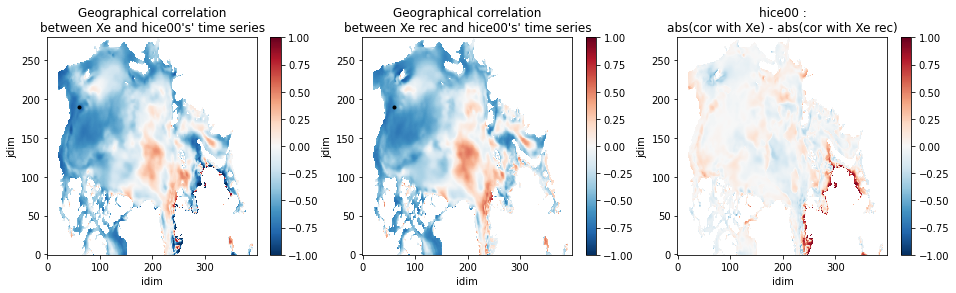

Xe : correlation value = [-0.7503951]
Xe rec : correlation value = [-0.14939643]


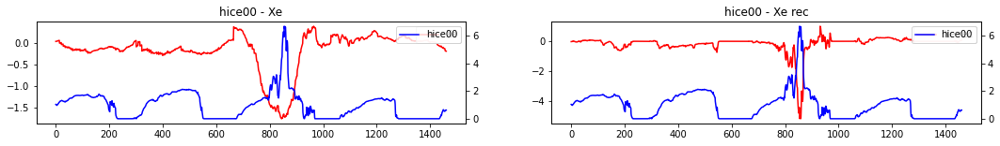

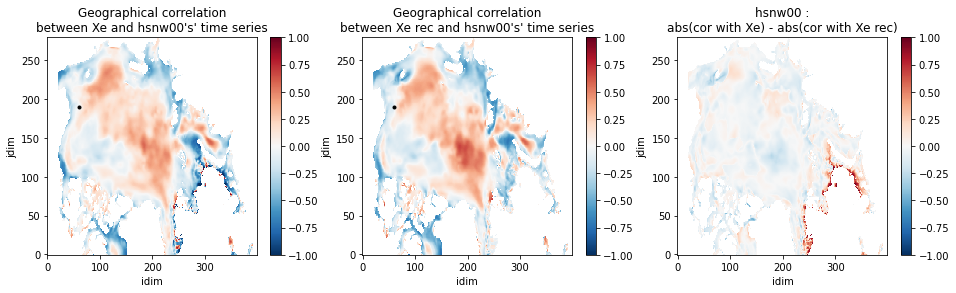

Xe : correlation value = [-0.02425728]
Xe rec : correlation value = [-0.14939643]


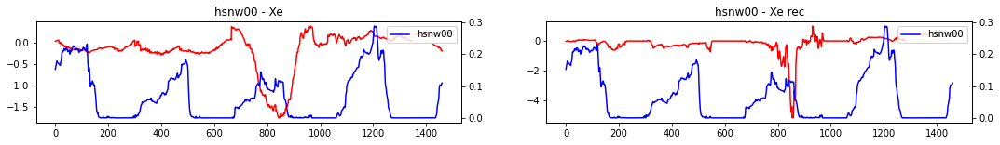

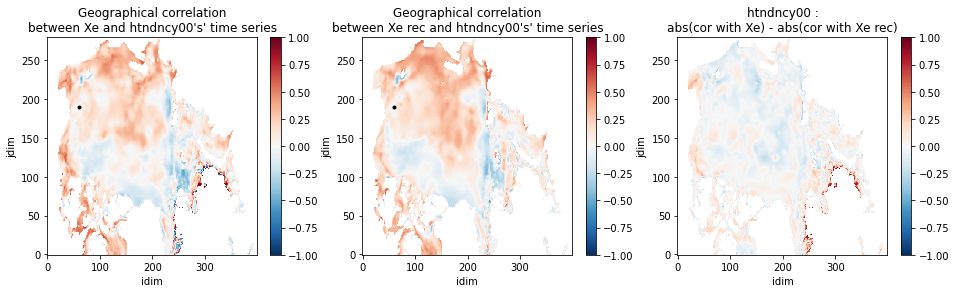

Xe : correlation value = [0.00598909]
Xe rec : correlation value = [-0.14939643]


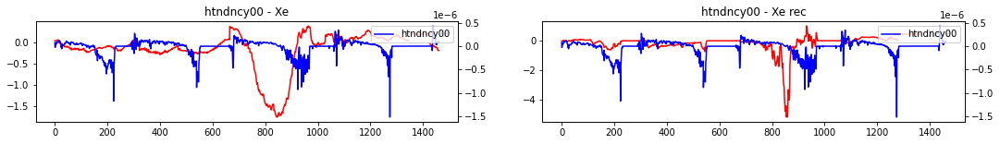

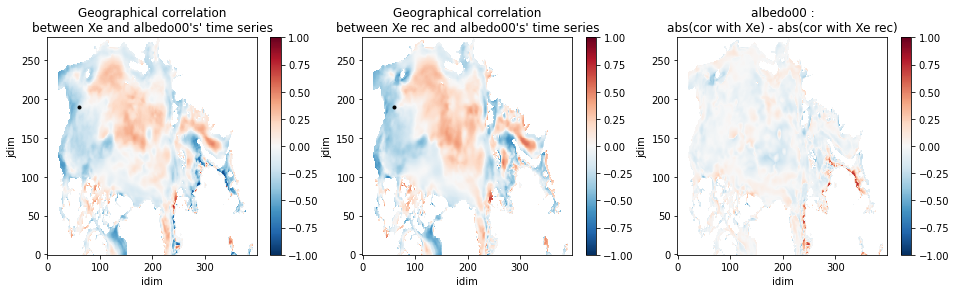

Xe : correlation value = [-0.2038713]
Xe rec : correlation value = [-0.14939643]


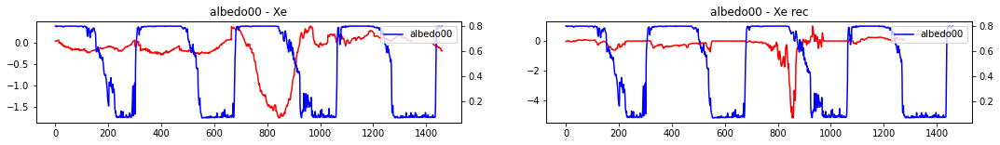

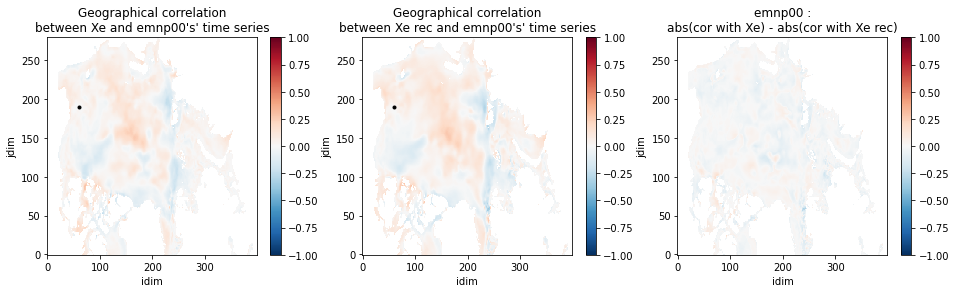

Xe : correlation value = [0.00771562]
Xe rec : correlation value = [-0.14939643]


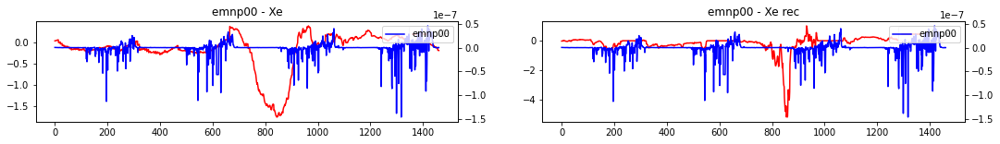

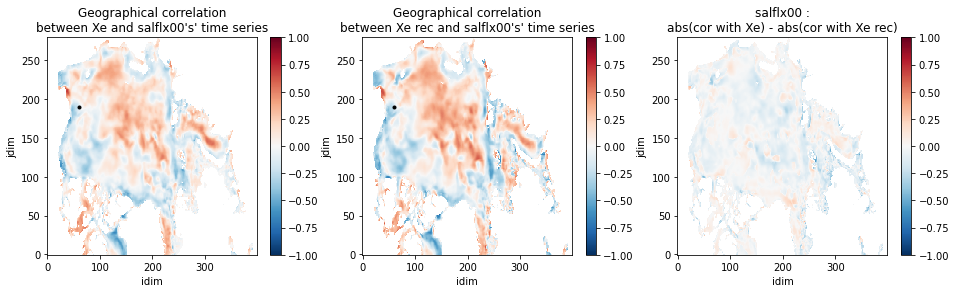

Xe : correlation value = [-0.10369199]
Xe rec : correlation value = [-0.14939643]


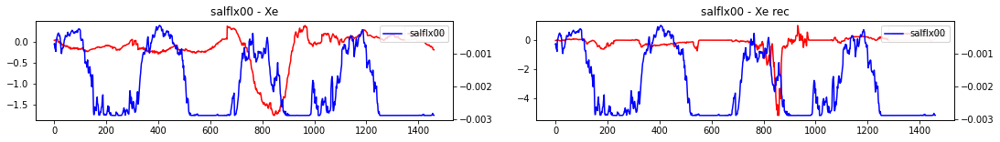

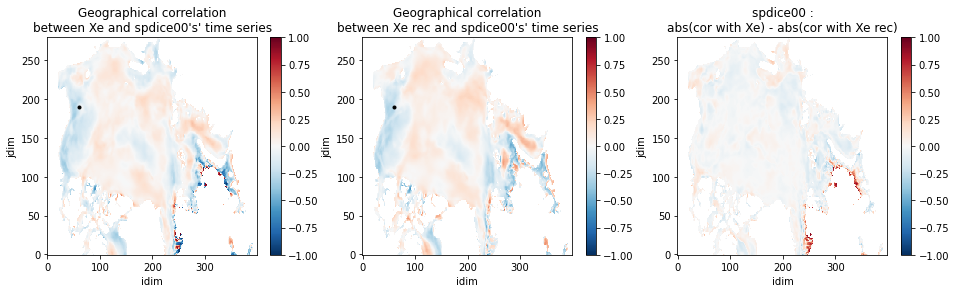

Xe : correlation value = [-0.10238457]
Xe rec : correlation value = [-0.14939643]


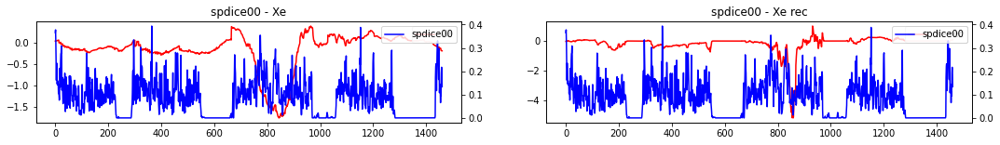

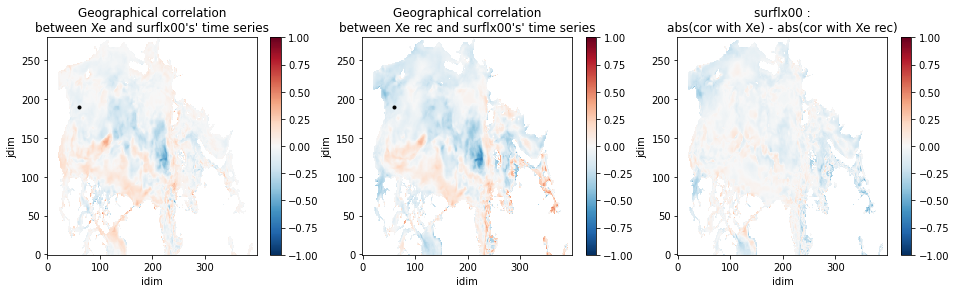

Xe : correlation value = [-0.05990162]
Xe rec : correlation value = [-0.14939643]


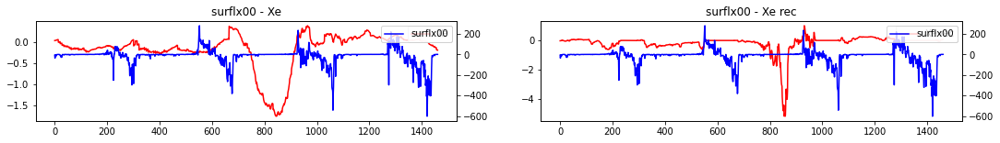

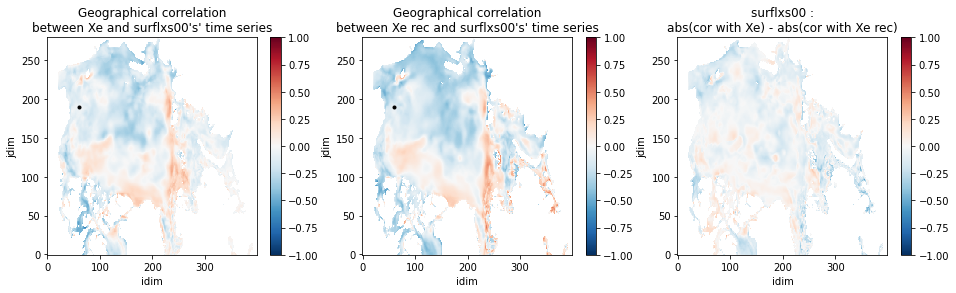

Xe : correlation value = [-0.05643218]
Xe rec : correlation value = [-0.14939643]


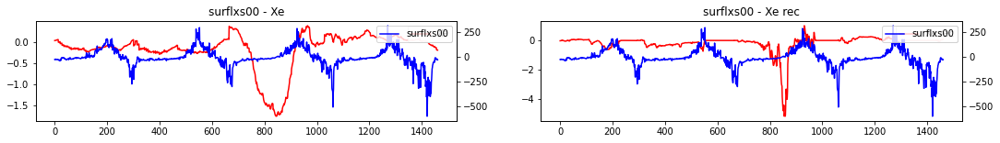

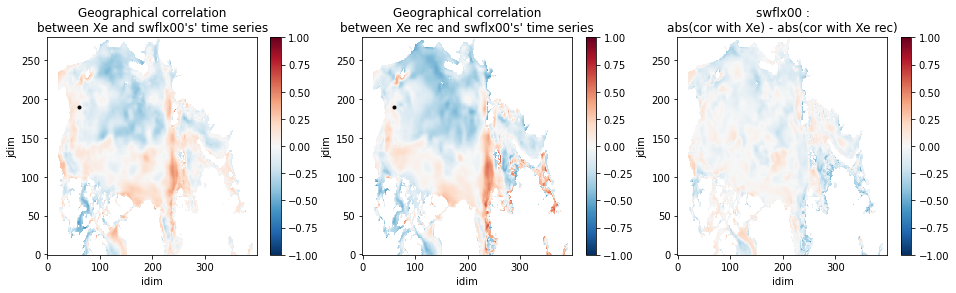

Xe : correlation value = [0.04951402]
Xe rec : correlation value = [-0.14939643]


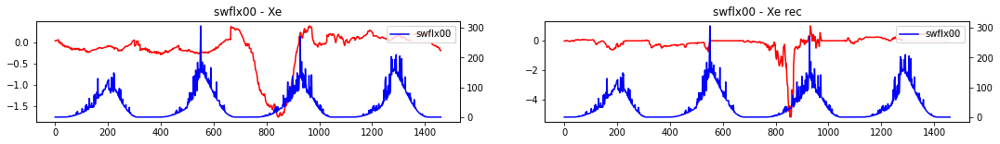

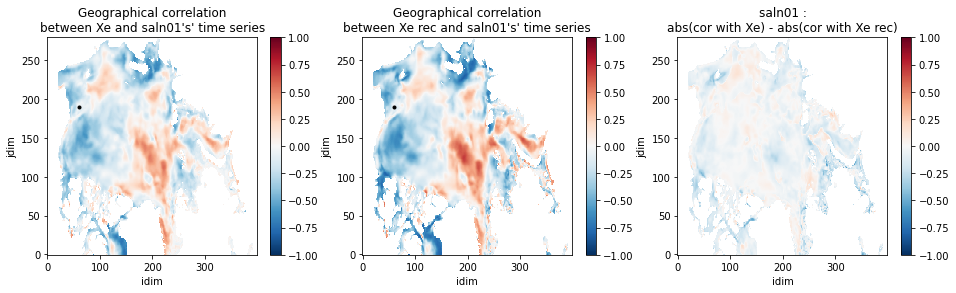

Xe : correlation value = [-0.03611699]
Xe rec : correlation value = [-0.14939643]


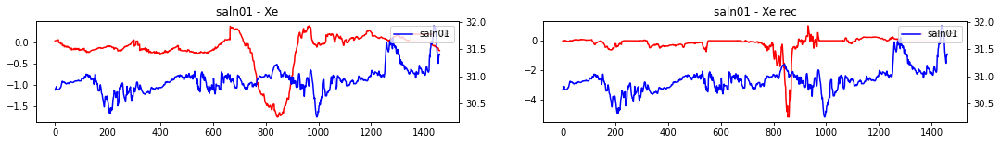

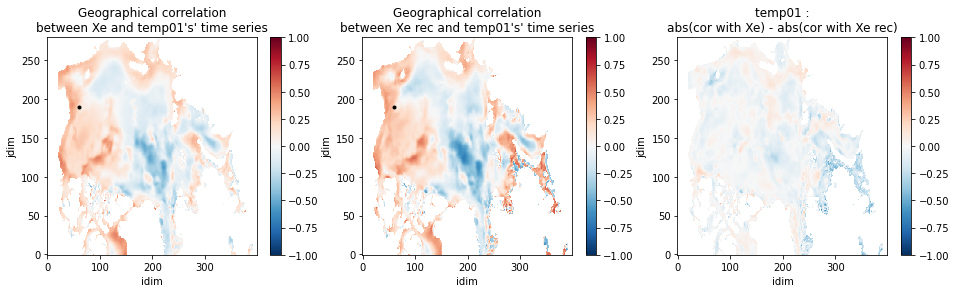

Xe : correlation value = [0.16631696]
Xe rec : correlation value = [-0.14939643]


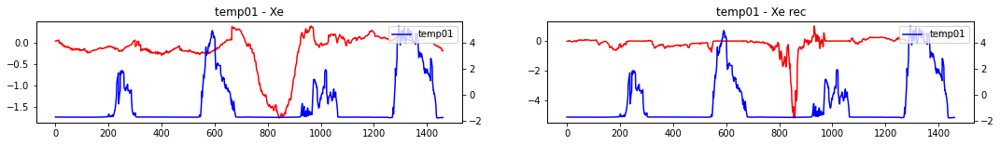

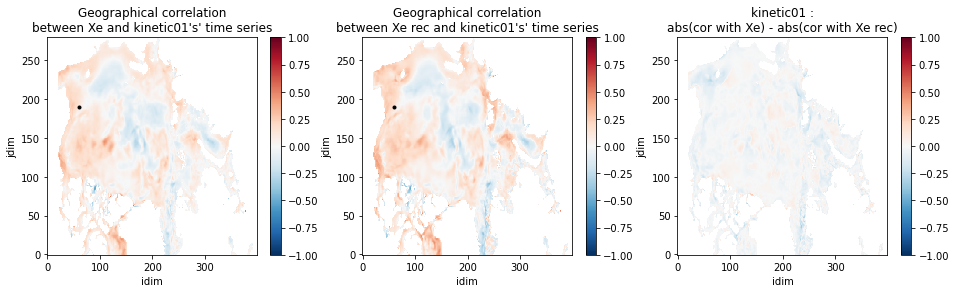

Xe : correlation value = [0.13234138]
Xe rec : correlation value = [-0.14939643]


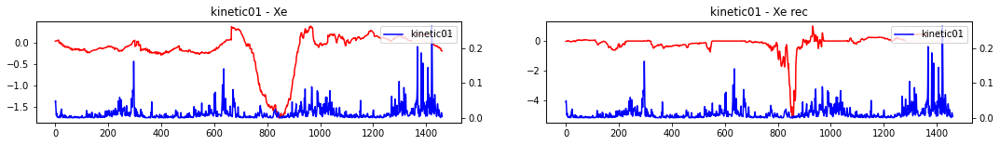

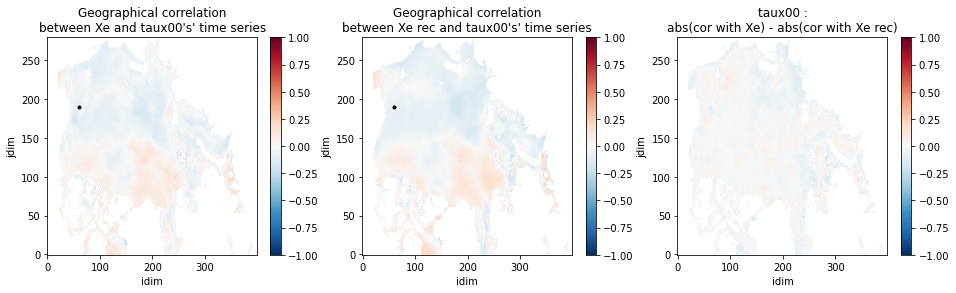

Xe : correlation value = [-0.04039594]
Xe rec : correlation value = [-0.14939643]


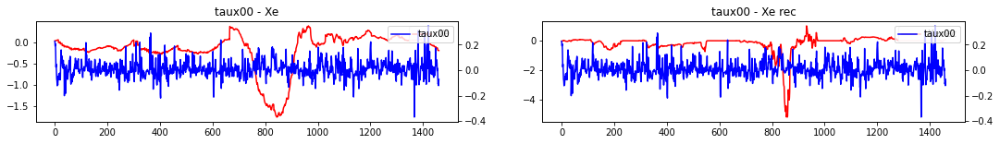

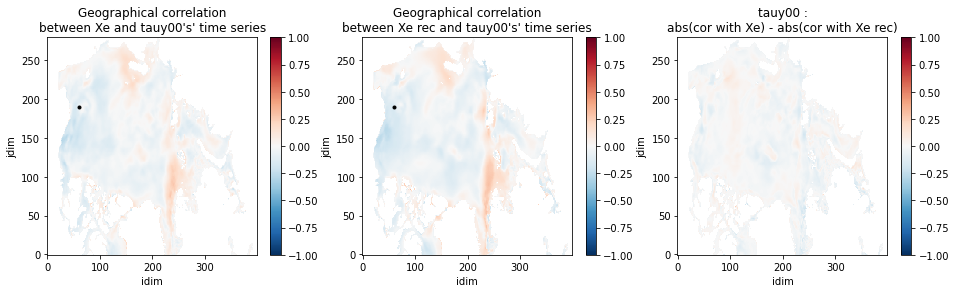

Xe : correlation value = [-0.05214473]
Xe rec : correlation value = [-0.14939643]


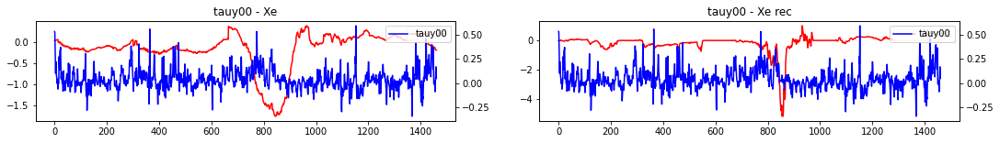

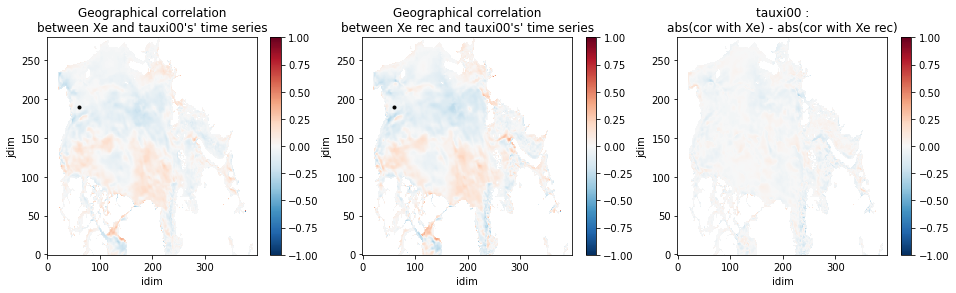

Xe : correlation value = [-0.0035328]
Xe rec : correlation value = [-0.14939643]


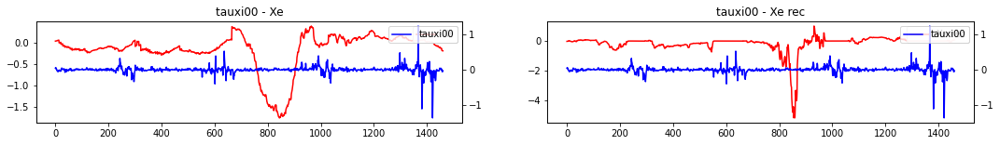

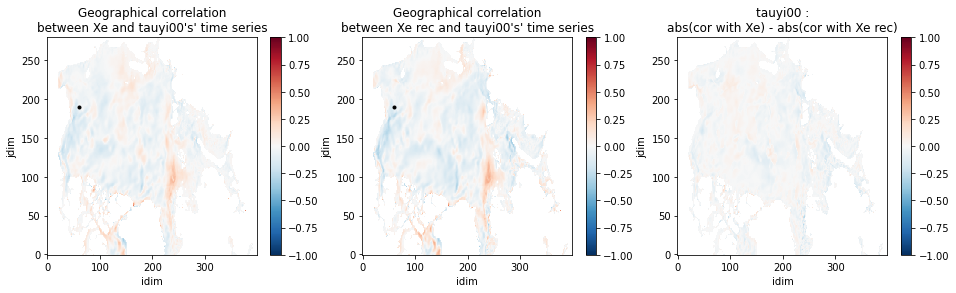

Xe : correlation value = [-0.00842165]
Xe rec : correlation value = [-0.14939643]


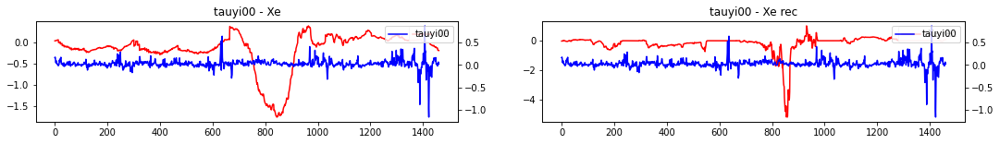

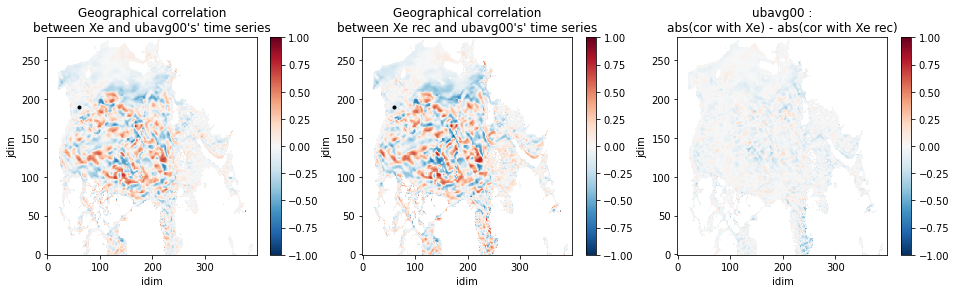

Xe : correlation value = [-0.07172058]
Xe rec : correlation value = [-0.14939643]


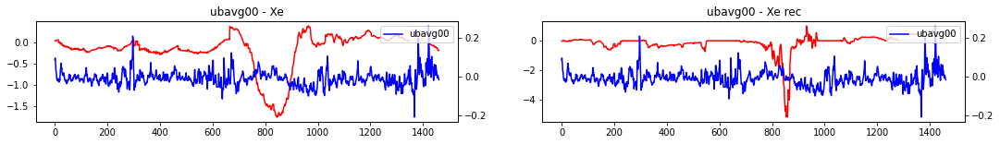

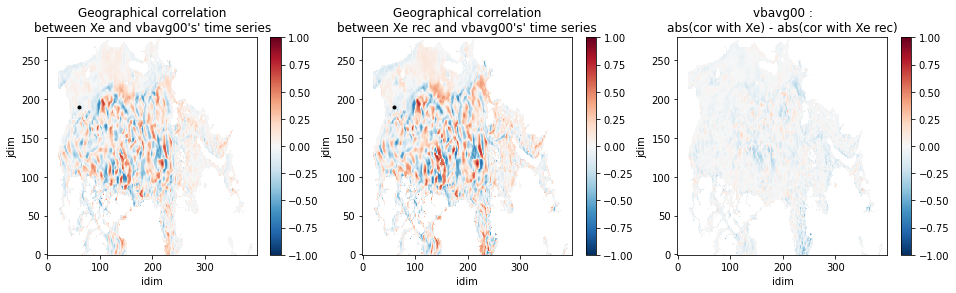

Xe : correlation value = [-0.10158673]
Xe rec : correlation value = [-0.14939643]


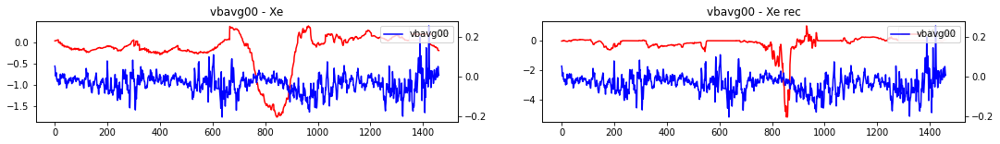

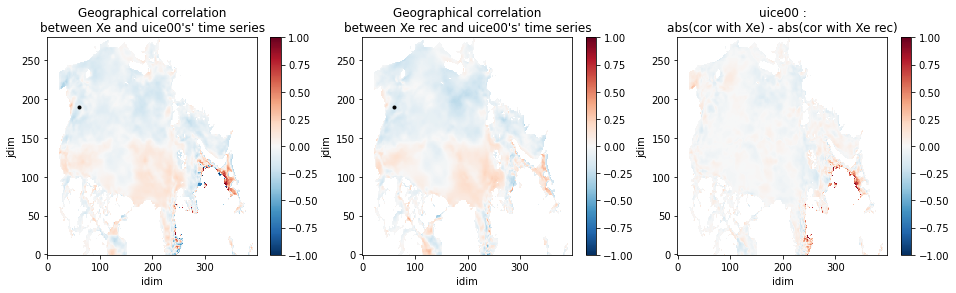

Xe : correlation value = [-0.08031275]
Xe rec : correlation value = [-0.14939643]


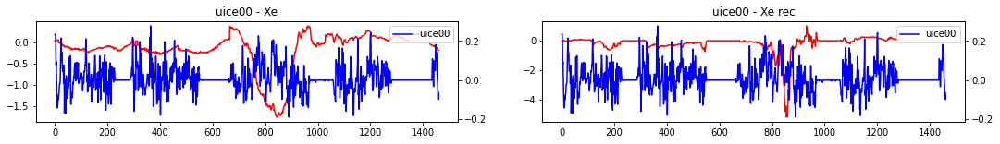

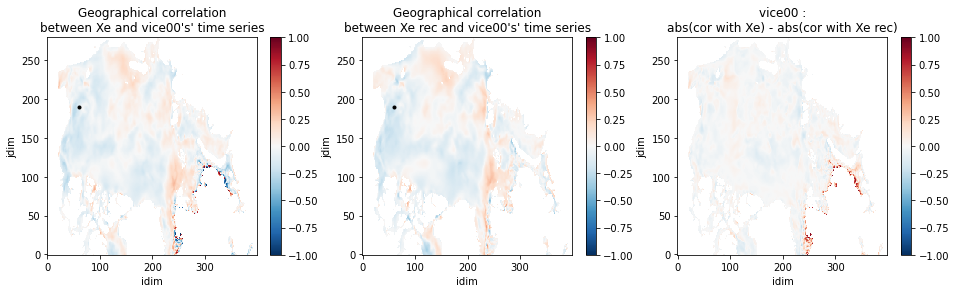

Xe : correlation value = [-0.11907199]
Xe rec : correlation value = [-0.14939643]


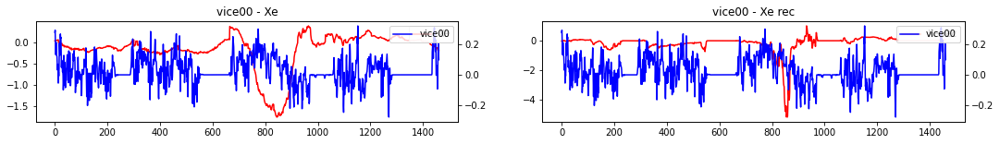

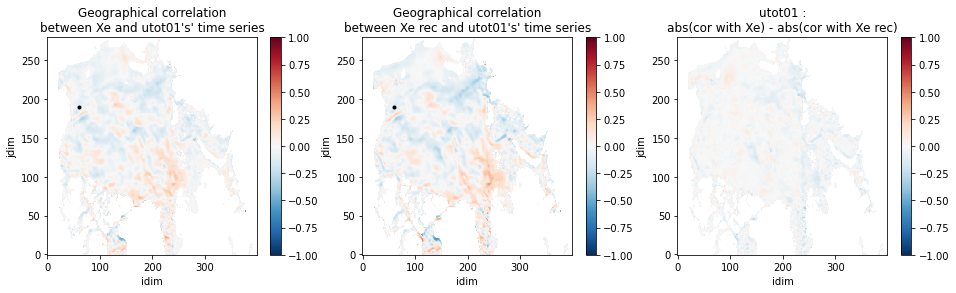

Xe : correlation value = [-0.08157777]
Xe rec : correlation value = [-0.14939643]


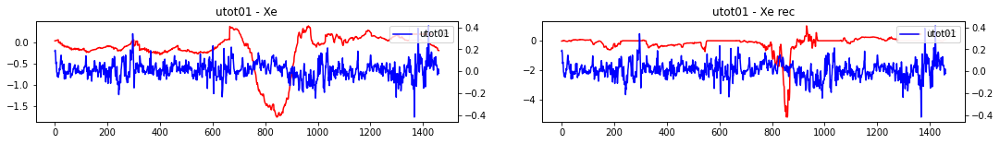

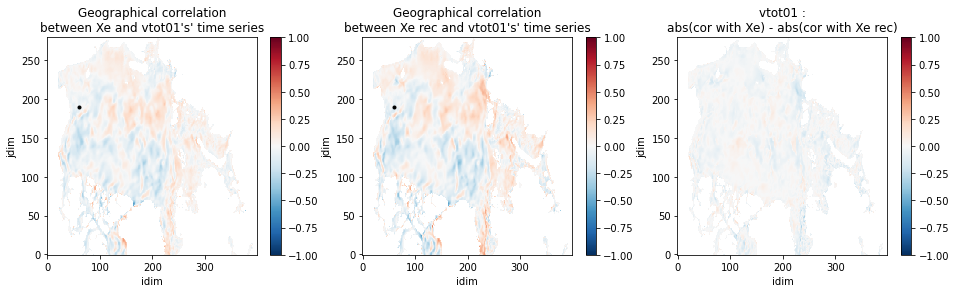

Xe : correlation value = [-0.09085725]
Xe rec : correlation value = [-0.14939643]


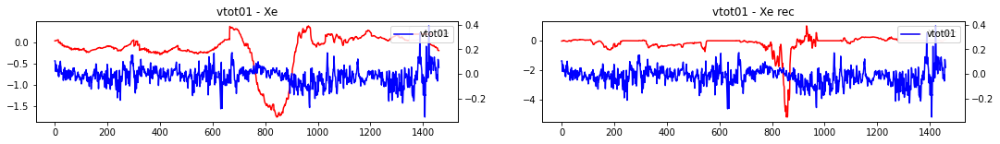

In [252]:
lookpoint(point1, [geo_cor_cov, geo_cor_cov_rec], ["Xe", "Xe rec"], [Xe_rec_reshape, Xe], X_sel_cov)

In [265]:
def get_ts_point(point, Xe, forcings, X_sel_cov):
    t = Xe.shape[0]
    i, j = point
    Xe_pt = np.reshape(Xe.sel(jdim=slice(*(j, j+1)),idim=slice(*(i, i+1))).values, (t))
    fgs_pt = dict([(f, np.reshape(forcings[f][:, j, i], (t))) for f in forcings.keys()])
    cov_pt = dict([(f, np.reshape(X_sel_cov[f][:, j, i], (t))) for f in X_sel_cov.keys()])
    
    return Xe_pt, fgs_pt, cov_pt

In [266]:
Xe_pt1, fgs_pt1, cov_pt1 = get_ts_point(point, Xe, forcings, X_sel_cov)

In [290]:
def plot_cor(X, Xpar):
    cor = dict()
    for f in Xpar.keys():
        cor[f] = np.corrcoef(X, Xpar[f])[0][1]
        print(f"{f:<15} {cor[f]}")

plot_cor(Xe_pt1, cov_pt1)
print()
plot_cor(Xe_pt1, fgs_pt1)

ssh00           0.028071756079711963
fice00          -0.19950979262964844
hice00          -0.5025167686004731
hsnw00          -0.19346031796404994
htndncy00       -0.12754263894497456
albedo00        -0.2214420400981913
emnp00          -0.10567605322960473
salflx00        -0.13865153108563996
spdice00        0.10332065329395076
surflx00        0.06271766617377944
surflxs00       0.1136954364178739
swflx00         0.05528389221842929
saln01          -0.45486188699673796
temp01          0.13408109677847263
kinetic01       0.17707989591533713
taux00          0.04542278896772014
tauy00          -0.08077020228695747
tauxi00         0.010622223417131017
tauyi00         -0.12134211673028389
ubavg00         0.4906243727799834
vbavg00         0.1610835043635186
uice00          0.057440897915155796
vice00          -0.12932165499410617
utot01          0.11540604921652863
vtot01          -0.10468835058725776

airtmp_mean21d  0.2336068011623087
dewpt_mean21d   0.24107435918238174
mslprs_mean21d  -0

In [ ]:
def compare_ts(i, j, X, param, cov, label, param_name=''):
    t = param.shape[0]
    fig, ax = plt.subplots(ncols=len(X), figsize=(18,2))

    for index in range(len(X)):
        print(f"{label[index]} : correlation value = {cov[index].sel(jdim=slice(*(j, j+1)),idim=slice(*(i, i+1))).values[0]}")

        if type(X[index]) != np.ndarray:
            err = np.reshape(X[index].sel(jdim=slice(*(j, j+index)),idim=slice(*(i, i+index))).values, (t))
        else:
            err = np.reshape(X[index][:, j, i], (t))
        par = np.reshape(param[:, j, i], (t))

        ax[index].set_title(f"{param_name} - {label[index]}")
        ax[index].plot(err, color='red', label=label[index])
        ax_twin = ax[index].twinx()
        ax_twin.plot(par, color='blue', label=param_name)
        ax[index].legend(loc="upper right")
        ax_twin.legend(loc="upper right")
    plt.show()